# Variational Autoencoder on Cartoons

Based on [post](https://learnopencv.com/variational-autoencoder-in-tensorflow/) from Aditya Sharma. Original code on github [here](https://github.com/spmallick/learnopencv/tree/master/Variational-Autoencoder-TensorFlow).

In this notebook, the model is :
- cleaned up (e.g. BN before activation, ...) 
- refactored to use the standard TF/Keras training loop

## Import and Setup

In [29]:
import gc
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import requests
import shutil
import tensorflow as tf
import time

from IPython import display as dispmod
from pathlib import Path
from PIL import Image
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import backend as K
from tensorflow.keras.utils import plot_model
from tensorflow import __version__
print(f"tensorflow version: {__version__}")

%matplotlib inline

tensorflow version: 2.3.0


In [30]:
from ecutils.ipython_utils import nb_setup
nb_setup()


from dl_experiments_tf import colab, dl, vae
colab.setup_colab()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Set autoreload mode
Not running on colab


## Load dataset and set key parameters

Cartoon set from google [see here](https://google.github.io/cartoonset/download.html).

Because it is stored on `https://storage.cloud.google.com`, it cannot easily be retrieved with `curl` or `wget`. In fact, using `requests`, we can see that what is downloaded is a HTML authentication page asking to log into google cloud.

To keep it simple, `carttonset10k.tgz` was downloaded onto gdrive first.

p2compressed: D:\PyProjects\dl-experiments-tf\nbs\cartoonset10k.tgz
p2dataset None
p2dataset if None cartoonset10k
Dataset already uploaded and extracted in cartoonset10k
--------------------------------------------------------------------------------
20,000 files in dataset, corresponding to pairs: image (image_id.png) and attributes (image_id.csv)


[WindowsPath('cartoonset10k/cs10000053986926948907.csv'),
 WindowsPath('cartoonset10k/cs10000053986926948907.png'),
 WindowsPath('cartoonset10k/cs10000354665834323549.csv'),
 WindowsPath('cartoonset10k/cs10000354665834323549.png')]

--------------------------------------------------------------------------------
Image for image_id cs10000053986926948907
  Downloaded image sizes: (500, 500)


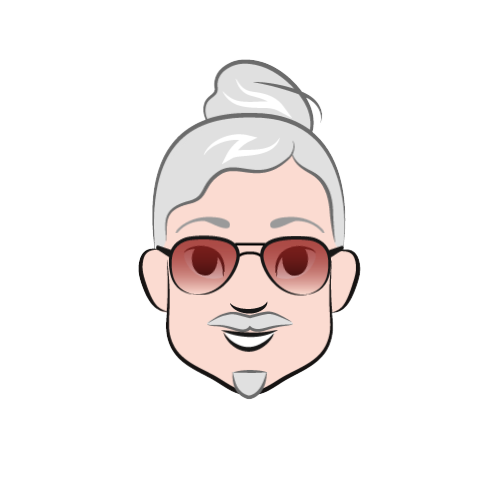

Attributes for image_id cs10000053986926948907
"eye_angle", 2, 3
"eye_lashes", 1, 2
"eye_lid", 0, 2
"chin_length", 2, 3
"eyebrow_weight", 1, 2
"eyebrow_shape", 8, 14
"eyebrow_thickness", 1, 4
"face_shape", 4, 7
"facial_hair", 7, 15
"hair", 84, 111
"eye_color", 4, 5
"face_color", 10, 11
"hair_color", 9, 10
"glasses", 0, 12
"glasses_color", 3, 7
"eye_slant", 1, 3
"eyebrow_width", 2, 3
"eye_eyebrow_distance", 1, 3



In [15]:
# p2tgz = Path('/content/gdrive/MyDrive/Tensorflow/VAE/cartoons/cartoonset10k.tgz')
p2tgz = Path('D:\\PyProjects\\dl-experiments-tf\\nbs\\cartoonset10k.tgz')
p2set = Path('cartoonset10k')

colab.unpack_compressed_dataset(p2compressed=p2tgz)


allfnames = sorted([f for f in p2set.iterdir()])
print(f"{len(allfnames):,d} files in dataset, corresponding to pairs: image (image_id.png) and attributes (image_id.csv)")
display(allfnames[:4])

imgfnames = sorted([f for f in p2set.iterdir() if 'png' in f.suffix])
attrfnames = sorted([f for f in p2set.iterdir() if 'csv' in f.suffix])

print(f"{'-'*80}")
imgfname = imgfnames[0]
print(f"Image for image_id {imgfname.stem}")
im = Image.open(imgfname)
print(f"  Downloaded image sizes: {im.size}")
display(im)

print(f"Attributes for image_id {imgfname.stem}")
with open(attrfnames[0], 'r') as f:
    print(f.read())

In [16]:
n_images = len([f.name for f in p2set.glob('*.png')])
n_images

10000

In [17]:
img_height, img_width = 256, 256
batch_size = 64

In [28]:
len(list(p2set.iterdir()))

20000

In [ ]:
ds = tf.keras.preprocessing.image_dataset_from_directory(
    p2set,
    label_mode=None,
    batch_size=1,
    image_size=(img_height, img_width),
    # shuffle=True
)

ds = tf.data.Dataset.list_files()

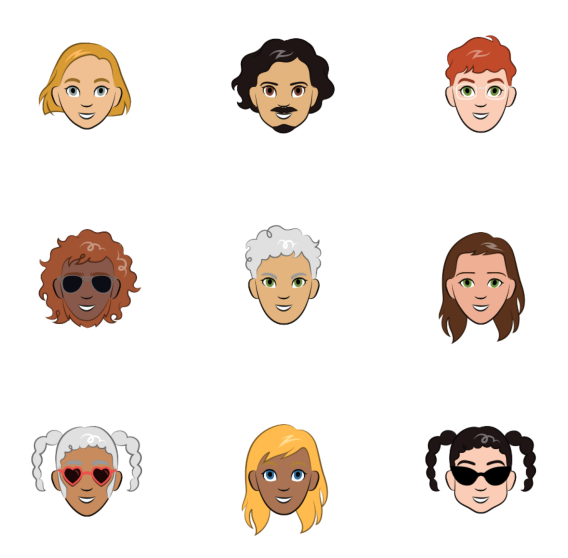

In [ ]:
# View a few cartoon images
n = 3
figsize = 10

plt.figure(figsize=(figsize, figsize))
for i, image in enumerate(ds.take(n * n)):
    ax = plt.subplot(n, n, i + 1)
    plt.imshow(image[0, :,:,:].numpy().astype("uint8"))
    plt.axis("off")

## Build model

Set key parameters and utility functions

In [ ]:
input_shape_4_img = (256, 256, 3)
# input_shape_4_txt = ()
input_shape_4_means_and_log_vars = (200,)

def plot_my_model(model, dpi=56):
    return plot_model(model, show_shapes=True, dpi=dpi)

### Build image encoder and test

Model: "Img-Encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 img_input_layer (InputLayer)   [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv_1 (Conv2D)                (None, 128, 128, 32  896         ['img_input_layer[0][0]']        
                                )                                                                 
                                                                                                  
 bn_1 (BatchNormalization)      (None, 128, 128, 32  128         ['conv_1[0][0]']                 
                                )                                                       

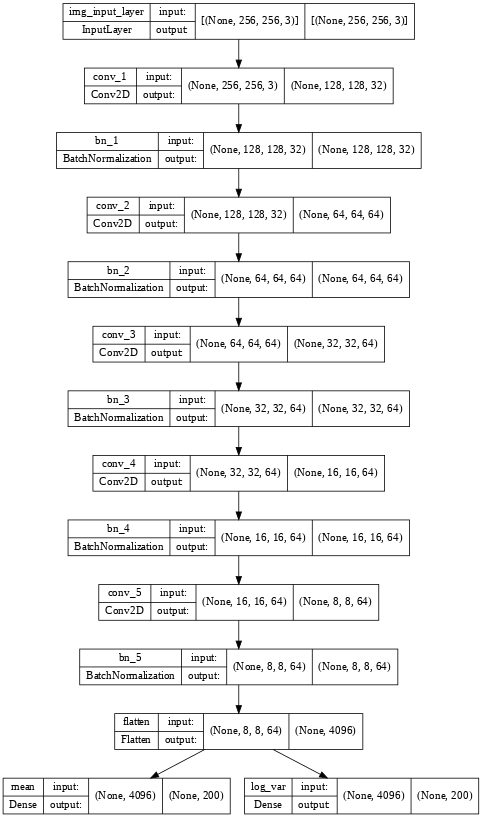

In [ ]:
def img_encoder(input_encoder):
    
    inputs = keras.Input(shape=input_encoder, name='img_input_layer')
    
    x = layers.Conv2D(32, kernel_size=3, strides=2, padding='same', activation='relu', name='conv_1')(inputs)
    x = layers.BatchNormalization(name='bn_1')(x)
    
    x = layers.Conv2D(64, kernel_size=3, strides=2, padding='same', activation='relu', name='conv_2')(x)
    x = layers.BatchNormalization(name='bn_2')(x)
        
    x = layers.Conv2D(64, 3, 2, padding='same', activation='relu', name='conv_3')(x)
    x = layers.BatchNormalization(name='bn_3')(x)

    x = layers.Conv2D(64, 3, 2, padding='same', activation='relu', name='conv_4')(x)
    x = layers.BatchNormalization(name='bn_4')(x)

    x = layers.Conv2D(64, 3, 2, padding='same', activation='relu', name='conv_5')(x)
    x = layers.BatchNormalization(name='bn_5')(x)

    flatten = layers.Flatten()(x)

    mean = layers.Dense(200, name='mean')(flatten)
    log_var = layers.Dense(200, name='log_var')(flatten)

    model = tf.keras.Model(inputs, (mean, log_var), name="Img-Encoder")
    
    return model

img_enc = img_encoder(input_shape_4_img)
img_enc.summary()
plot_my_model(img_enc)

In [ ]:
img_enc.output

(<KerasTensor: shape=(None, 200) dtype=float32 (created by layer 'mean')>,
 <KerasTensor: shape=(None, 200) dtype=float32 (created by layer 'log_var')>)

In [ ]:
# img_enc.save('vae-comics-refactored -enc.h5')

### Build latent space sampler
Stochastic latent vector sampling layer

In [ ]:
def sampling_model(distribution_params):
    """Returns z stochastic vector based on distribution_params = (mean, log_var)"""
    mean, log_var = distribution_params
    epsilon = K.random_normal(shape=K.shape(mean), mean=0., stddev=1.)
    return mean + K.exp(log_var / 2) * epsilon

def sampling(input_1,input_2):
    """Building a lambda layer as the z sampling layer"""
    mean = keras.Input(shape=input_1, name='input_mean')
    log_var = keras.Input(shape=input_2, name='input_log_var')
    out = layers.Lambda(sampling_model, name='encoder_output')([mean, log_var])
    sampler = tf.keras.Model([mean,log_var], out,  name="Img-Sampler")
    return sampler

Model: "Img-Sampler"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_mean (InputLayer)        [(None, 200)]        0           []                               
                                                                                                  
 input_log_var (InputLayer)     [(None, 200)]        0           []                               
                                                                                                  
 encoder_output (Lambda)        (None, 200)          0           ['input_mean[0][0]',             
                                                                  'input_log_var[0][0]']          
                                                                                                  
Total params: 0
Trainable params: 0
Non-trainable params: 0
____________________________

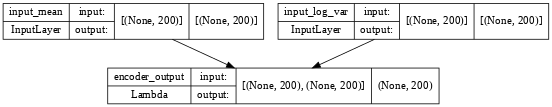

In [ ]:
img_latent_space_sampler = sampling(input_shape_4_means_and_log_vars, input_shape_4_means_and_log_vars)
img_latent_space_sampler.summary()

assert img_latent_space_sampler.output.get_shape()[1] == input_shape_4_means_and_log_vars[0]

plot_my_model(img_latent_space_sampler)

In [ ]:
img_latent_space_sampler.output

<KerasTensor: shape=(None, 200) dtype=float32 (created by layer 'encoder_output')>

In [ ]:
# img_latent_space_sampler.save('sampling.h5')

### Build decoder and test

Model: "Img-Decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 200)]             0         
                                                                 
 dense_1 (Dense)             (None, 4096)              823296    
                                                                 
 Reshape_Layer (Reshape)     (None, 8, 8, 64)          0         
                                                                 
 conv_transpose_1 (Conv2DTra  (None, 16, 16, 64)       36928     
 nspose)                                                         
                                                                 
 bn_1 (BatchNormalization)   (None, 16, 16, 64)        256       
                                                                 
 conv_transpose_2 (Conv2DTra  (None, 32, 32, 64)       36928     
 nspose)                                               

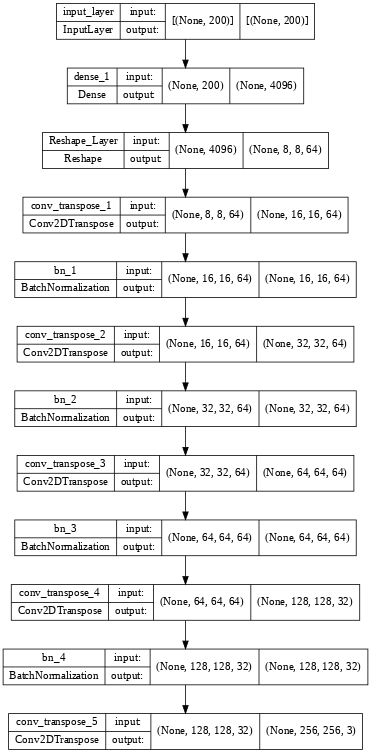

In [ ]:
def img_decoder(input_decoder):
    
    inputs = keras.Input(shape=input_decoder, name='input_layer')

    # output for the Dense layer must be compatible with the first conv shape, 
    # i.e. the last encoder conv: (8, 8, 64). 8 * 8 * 64 = 4096
    x = layers.Dense(4096, name='dense_1')(inputs)
    x = layers.Reshape((8, 8, 64), name='Reshape_Layer')(x)
   
    # Block-1
    x = layers.Conv2DTranspose(64, 3, strides= 2, padding='same', activation='relu', name='conv_transpose_1')(x)
    x = layers.BatchNormalization(name='bn_1')(x)
  
    # Block-2
    x = layers.Conv2DTranspose(64, 3, strides= 2, padding='same', activation='relu', name='conv_transpose_2')(x)
    x = layers.BatchNormalization(name='bn_2')(x)
    
    # Block-3
    x = layers.Conv2DTranspose(64, 3, 2, padding='same', activation='relu', name='conv_transpose_3')(x)
    x = layers.BatchNormalization(name='bn_3')(x)

    # Block-4
    x = layers.Conv2DTranspose(32, 3, 2, padding='same', activation='relu', name='conv_transpose_4')(x)
    x = layers.BatchNormalization(name='bn_4')(x)
    
    # Block-5
    # Using sigmoid as activation to force pixel values to be between 0 and 1
    outputs = layers.Conv2DTranspose(3, 3, 2, padding='same', activation='sigmoid', name='conv_transpose_5')(x)

    model = tf.keras.Model(inputs, outputs, name="Img-Decoder")
    return model

img_dec = img_decoder(input_shape_4_means_and_log_vars)
img_dec.summary()
assert img_dec.output.get_shape()[1:] == (256, 256, 3), f"Output shape {img_dec.output.get_shape()} not compatible with image size"

plot_my_model(img_dec)

In [ ]:
img_dec.output

<KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'conv_transpose_5')>

In [ ]:
# img_dec.save('vae-fashion-dec.h5')

### Build VAE Model and test

Build the model to output the reconstructed image as well as `means` and `log_vars` in order to apply their respective loss functions. (see [training guide](https://www.tensorflow.org/guide/keras/train_and_evaluate#the_compile_method_specifying_a_loss_metrics_and_an_optimizer) on tensforflow docs)

> If your model has multiple outputs, you can specify different losses and metrics for each output, and you can modulate the contribution of each output to the total loss of the model. You will find more details about this in the Passing data to multi-input, multi-output models [section](https://www.tensorflow.org/guide/keras/train_and_evaluate#passing_data_to_multi-input_multi-output_models).

```python
            image_input = keras.Input(shape=(32, 32, 3), name="img_input")
            timeseries_input = keras.Input(shape=(None, 10), name="ts_input")

            x1 = layers.Conv2D(3, 3)(image_input)
            x1 = layers.GlobalMaxPooling2D()(x1)
            x2 = layers.Conv1D(3, 3)(timeseries_input)
            x2 = layers.GlobalMaxPooling1D()(x2)
            x = layers.concatenate([x1, x2])

            score_output = layers.Dense(1, name="score_output")(x)
            class_output = layers.Dense(5, name="class_output")(x)

            model = keras.Model(
                inputs=[image_input, timeseries_input], outputs=[score_output, class_output]
            )
```
>
> At compilation time, we can specify different losses to different outputs, by passing the loss functions as a list:
```python
        model.compile(
            optimizer=keras.optimizers.RMSprop(1e-3),
            loss=[keras.losses.MeanSquaredError(), keras.losses.CategoricalCrossentropy()],
)
```
> It's possible to give different weights to different output-specific losses (for instance, one might wish to privilege the "score" loss in our example, by giving to 2x the importance of the class loss), using the loss_weights argument:
```python
        model.compile(
            optimizer=keras.optimizers.RMSprop(1e-3),
            loss={
                "score_output": keras.losses.MeanSquaredError(),
                "class_output": keras.losses.CategoricalCrossentropy(),
            },
            },
            loss_weights={"score_output": 2.0, "class_output": 1.0},
)
```

Model: "VAE"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 img_input_layer (InputLayer)   [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 Img-Encoder (Functional)       ((None, 200),        1770128     ['img_input_layer[0][0]']        
                                 (None, 200))                                                     
                                                                                                  
 Img-Sampler (Functional)       (None, 200)          0           ['Img-Encoder[0][0]',            
                                                                  'Img-Encoder[0][1]']          

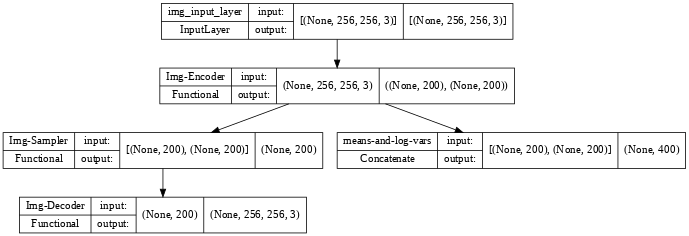

In [ ]:
def vae_model(input_encoder, p2enc=None, p2dec=None):
    
    img_enc = img_encoder(input_encoder)
    if p2enc is not None:
        img_enc.load_weights(p2enc)
    img_latent_space_sampler = sampling(input_shape_4_means_and_log_vars, input_shape_4_means_and_log_vars)
    img_dec = img_decoder(input_shape_4_means_and_log_vars)
    if p2dec is not None:
        img_dec.load_weights(p2dec)

    img_inputs = keras.Input(shape=input_encoder, name='img_input_layer')
    means, log_vars = img_enc(img_inputs)
    z = img_latent_space_sampler([means, log_vars])
    img_output = img_dec(z)
    m_and_lv = layers.Concatenate(axis=-1, name='means-and-log-vars')([means, log_vars])

    model = tf.keras.Model(inputs=[img_inputs], outputs=[img_output, m_and_lv], name="VAE")
    
    return model

vae = vae_model(input_shape_4_img)
vae.summary()

plot_my_model(vae)

Check that output of `vae` is what is expected, i.e. one inage and one array with 2 * 200

In [ ]:
for img_b in ds.take(1):
    o = vae(img_b)
    print(f" output is of class: {type(o)} and has a length of {len(o)}")
    print(o[0].shape, o[1].shape)

 output is of class: <class 'list'> and has a length of 2
(1, 256, 256, 3) (1, 400)


In [ ]:
for img_b in ds.take(1):
    img, m_and_lv = vae(img_b)
    print(img.shape, m_and_lv.shape)

(1, 256, 256, 3) (1, 400)


### Creating the training dataset
Refer to this [guide](https://www.tensorflow.org/guide/data#decoding_image_data_and_resizing_it) in tf docs

Ideas: for each image in the dataset (defined by the `png` file name), each element in the dataset must include:
- the loaded and preprocessed image as input
- the loaded and preprocessed image as image output ground truth to evaluate reconstruction
- the ground truth for `means-and-log-vars`
    - `means-and-log-vars` output should approach the mean and log_var of a unit normal distribution, as closely as possible. 
    - Therefore, the ground thrith for should be: means=0 and var=1 or log_var=0.

The train dataset structure: 
- inputs: 
    - images
- outputs:
    - images
    - means-and-log-vars tensor

To build this dataset, the anchor is the list of image fine names: `Dataset.list_files(imgfnames)`

Then, we apply a custom transformation to:
- load the image in the appropriate format
- create the ground truth means-and-log-vars values
- return the structured element (image, (image, means-and-log-vars))

In [ ]:
# List of files to pass to tf.data.Dataset.list_files must be a list of strings
list_of_files = [str(f.absolute()) for f in p2set.glob('*.png')]
list_ds = tf.data.Dataset.list_files(list_of_files)
len(list_ds)

10000

In [ ]:
def parse_dataset_element_from_file(filename):
    """Return one dataset element for as (image, (image, means_and_log_var)"""
    image = tf.io.read_file(filename)
    image = tf.io.decode_png(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [img_height, img_width])

    malv = tf.constant(np.zeros(shape=(400)))
    return image, (image, malv)

Test the fuction `parse_dataset_element_from_file` with one simple file name from `list_ds`

image imput shape  (256, 256, 3)
image output shape (256, 256, 3), means-and-log-vars shape (400,)


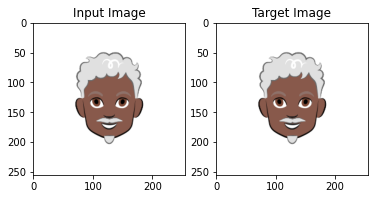

Target  means and log vars equal to 0: True


In [ ]:
for element in list_ds.take(1):
    img_in, (img_out, malv) = parse_dataset_element_from_file(element)
    print(f"image imput shape  {img_in.shape}")
    print(f"image output shape {img_out.shape}, means-and-log-vars shape {malv.shape}")
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(img_in)
    plt.title('Input Image')
    plt.subplot(1, 2, 2)
    plt.imshow(img_out)
    plt.title('Target Image')
    plt.show()
    print(f"Target  means and log vars equal to 0: {malv.numpy().sum() < 1e-10}")

Create the training dataset as a transformation on  `list_ds`, applying our `parse_dataset_element_from_file` custom transform, then applying a batch size

In [ ]:
train_ds = list_ds.map(parse_dataset_element_from_file).batch(batch_size=batch_size)
print(f"Training dataset with {len(train_ds)} batches of {batch_size} max")
print('Dataset Element specification')
train_ds.element_spec

Training dataset with 157 batches of 64 max
Dataset Element specification


(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None),
 (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 400), dtype=tf.float64, name=None)))

Test the dataset

(64, 256, 256, 3) (64, 400)


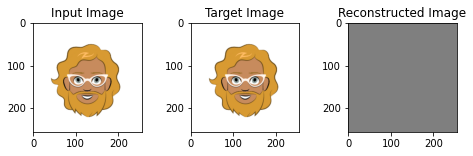

Target means and log vars equal to 0: True



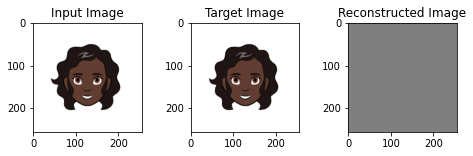

Target means and log vars equal to 0: True



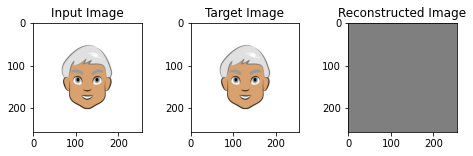

Target means and log vars equal to 0: True



In [ ]:
for element in train_ds.take(1):
    img_in, (img_target, malv) = element
    img_rec, _ = vae(img_in)
    print(img_in.shape, malv.shape)
    for n in range(3):
        plt.figure(figsize=(8, 2))
        plt.subplot(1, 3, 1)
        plt.imshow(img_in[n, :, :, :])
        plt.title('Input Image')
        plt.subplot(1, 3, 2)
        plt.imshow(img_target[n, :, :, :])
        plt.title('Target Image')
        plt.subplot(1, 3, 3)
        plt.imshow(img_rec[n, :, :, :])
        plt.title('Reconstructed Image')

        plt.show()
        print(f"Target means and log vars equal to 0: {tf.reduce_sum(malv[n, :]).numpy() < 1e-5}\n")

### Loss Function

In [ ]:
class MSELoss:
    """Class to evaluate MSE and vary a multiplication factor"""
    def __init__(self):
        self.factor = 1

    def __call__(self, y_true, y_pred):
        loss = tf.math.reduce_mean(tf.math.square(y_true - y_pred), axis = [1,2,3])
        return self.factor * loss

mse_loss = MSELoss()

class OptimumSigmaReconstructionLoss:
    """Class to set and evaluate the Optimum Sigma VAE Reconstruction Loss

    Based on paper: "Simple and Effective VAE Training with Calibrated Decoders" (arxiv.2006.13202)
    """
    def __init__(self, z_dim=200):
        self.factor = 1
        self.z_dim = z_dim

    def __call__(self, img_true, img_rec):
        log_sigma = tf.math.log(tf.sqrt(tf.reduce_mean((img_true - img_rec)**2,
                                                  [0, 1, 2, 3],
                                                  keepdims=True)) + 1
        )
        rec_loss = tf.reduce_sum(self.gaussian_nll(img_rec, log_sigma, img_true))
        return rec_loss

    @staticmethod
    def gaussian_nll(mu, log_sigma, x):
        val = 0.5 * ((x - mu)/tf.exp(log_sigma))**2 + log_sigma + 0.5 *np.log(2 * np.pi)
        return val

rec_loss = OptimumSigmaReconstructionLoss()

The KL divergence loss for a VAE for a single sample is defined as:
$$\frac{1}{2} \left[ \left(\sum_{i=1}^{z}\mu_{i}^{2} + \sum_{i=1}^{z}\sigma_{i}^{2} \right) - \sum_{i=1}^{z} \left(log(\sigma_{i}^{2}) + 1 \right) \right]$$
$$\frac{1}{2} \left[ \sum_{i=1}^{z}\left(\mu_{i}^{2} + \sigma_{i}^{2} - log(\sigma_{i}^{2}) + 1 \right) \right]$$
$$\frac{1}{2} \left[ \sum_{i=1}^{z}\left(\mu_{i}^{2} + \exp{(\log(var))} - log(var) + 1 \right) \right]$$

In [ ]:
class KLDivergenceLoss:
    """Class to evaluate KL Divergence Loss and vary beta and a multiplication facto"""
    def __init__(self):
        self.factor = 1
        self.beta = 1

    def __call__(self, y_true, y_pred): 
        """We do not need to use the true values as KL divergence loss assume unit normal distribution"""
        # Split the means and log vars tensor into means and log vars
        means = y_pred[:, :input_shape_4_means_and_log_vars[0]]
        log_vars = y_pred[:, input_shape_4_means_and_log_vars[0]:]
        loss =  0.5 * tf.reduce_sum(tf.math.square(means) + tf.math.exp(log_vars) - log_vars - 1, axis=1)
        return loss * self.factor * self.beta
        
kl_loss = KLDivergenceLoss()

Test the loss functions with a few elements

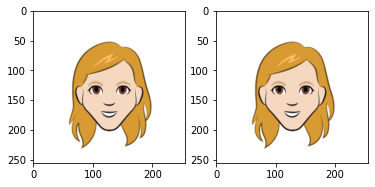

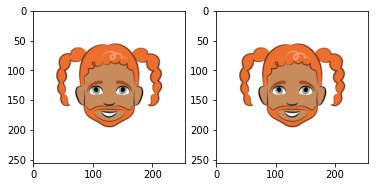

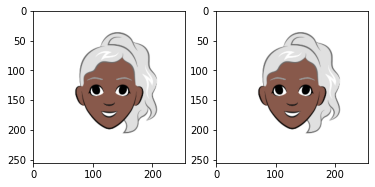

MSE Loss on input vs target:        0.0
MSE Loss on input vs reconstructed: 13.463888168334961
Reconstruction Loss on input vs target:        11562913.0
Reconstruction Loss on input vs reconstructed: 16935300.0
KL Divergence Loss:                 18.893186569213867


In [ ]:
for element in train_ds.take(1):
    img_in, (img_target, means_and_log_vars) = element
    for n in range(3):
        plt.figure()
        plt.subplot(1, 2, 1)
        plt.imshow(img_in[n, :, :, :])
        plt.subplot(1, 2, 2)
        plt.imshow(img_in[n, :, :, :])
        plt.show()
    img_rec, malv = vae(img_in)
    print(f"MSE Loss on input vs target:        {mse_loss(img_in, img_target).numpy().sum()}")
    print(f"MSE Loss on input vs reconstructed: {mse_loss(img_in, img_rec).numpy().sum()}")
    print(f"Reconstruction Loss on input vs target:        {rec_loss(img_in, img_target).numpy().sum()}")
    print(f"Reconstruction Loss on input vs reconstructed: {rec_loss(img_in, img_rec).numpy().sum()}")
    print(f"KL Divergence Loss:                 {kl_loss(means_and_log_vars, malv).numpy().sum()}")

## Compile model and train

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
RUN_AGAIN = False
if RUN_AGAIN:
    lr = 5e-4

    vae = vae_model(input_shape_4_img)

    optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    vae.compile(
        optimizer=optimizer,
        loss=[mse_loss, kl_loss]
    )

    es = EarlyStopping(
        monitor='loss',
        min_delta= 5e-3,
        patience=5,
        verbose=1,
        mode='min',
        restore_best_weights=True
    )

    plot_my_model(vae)

In [ ]:
if RUN_AGAIN:
    hist = vae.fit(
        x=train_ds,
        epochs=100,
        callbacks=[es],
        verbose=1
    )
    pd.DataFrame(hist.history).plot()

In [ ]:
if RUN_AGAIN:
    for element in train_ds.take(1):
        img_in, (_, means_and_log_vars) = element
        img_out, _ = vae(img_in)
        for n in range(8):
            plt.figure()
            plt.subplot(1, 2, 1)
            plt.imshow(img_in[n, :, :, :])
            plt.subplot(1, 2, 2)
            plt.imshow(img_out[n, :, :, :])
            plt.show()
        img_rec, malv = vae(img_in)
        print(f"MSE Loss on input vs target:        {mse_loss(img_in, img_out).numpy().sum()}")
        print(f"MSE Loss on input vs reconstructed: {mse_loss(img_in, img_rec).numpy().sum()}")
        print(f"KL Divergence Loss:                 {kl_loss(means_and_log_vars, malv).numpy().sum()}")

In [ ]:
p2drive = Path('/content/gdrive/MyDrive/Tensorflow/VAE/training_weights')

In [ ]:
from datetime import datetime

SAVE_MODEL = False
name_seed = 'cartoon-keras'
if not SAVE_MODEL:
    print('If <SAVE_MODEL> set True, will save encoder and decoder as:')
    print(f"- {name_seed}_enc_final_{datetime.now().strftime('%y%m%d')}.h5")
    print(f"- {name_seed}_dec_final_{datetime.now().strftime('%y%m%d')}.h5")
else: 
    img_enc.save_weights(p2drive/f"{name_seed}_enc_final_{datetime.now().strftime('%y%m%d')}.h5")
    img_dec.save_weights(p2drive/f"{name_seed}_dec_final_{datetime.now().strftime('%y%m%d')}.h5")
    print('Saved encoder and decoder as:')
    print(f"- {name_seed}_enc_final_{datetime.now().strftime('%y%m%d')}.h5")
    print(f"- {name_seed}_dec_final_{datetime.now().strftime('%y%m%d')}.h5")

If <SAVE_MODEL> set True, will save encoder and decoder as:
- cartoon-keras_enc_final_220626.h5
- cartoon-keras_dec_final_220626.h5


In [ ]:
# img_enc.load_weights(p2drive/'cartoon-keras_enc_final_220625.h5')
# img_dec.load_weights(p2drive/'cartoon-keras_dec_final_220625.h5')
# print('Model weights loaded')

In [ ]:
if RUN_AGAIN:
    for element in train_ds.take(1):
        img_in, (img_out, means_and_log_vars) = element
        img_rec, malv = vae(img_in)
        for n in range(8):
            plt.figure()
            plt.subplot(1, 2, 1)
            plt.imshow(img_in[n, :, :, :])
            plt.subplot(1, 2, 2)
            plt.imshow(img_rec[n, :, :, :])
            plt.show()
        print(f"MSE Loss on input vs target:        {mse_loss(img_in, img_out).numpy().sum()}")
        print(f"MSE Loss on input vs reconstructed: {mse_loss(img_in, img_rec).numpy().sum()}")
        print(f"KL Divergence Loss:                 {kl_loss(means_and_log_vars, malv).numpy().sum()}")

## Experiment with optimizer parameters

In [ ]:
if tf.config.list_physical_devices('GPU'):
  print("TensorFlow **IS** using the GPU")
else:
  print("TensorFlow **IS NOT** using the GPU")

TensorFlow **IS** using the GPU


In [ ]:
from datetime import datetime
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
def illustrate_performance(model):
    for element in train_ds.take(1):
        img_in, (img_target, means_and_log_vars) = element
        img_rec, malv = model(img_in)
        for n in range(5):
            plt.figure()
            plt.subplot(1, 3, 1)
            plt.imshow(img_in[n, :, :, :])
            plt.title('Input Image')
            plt.subplot(1, 3, 2)
            plt.imshow(img_target[n, :, :, :])
            plt.title('Target Image')
            plt.subplot(1, 3, 3)
            plt.imshow(img_rec[n, :, :, :])
            plt.title('Reconstructed Image')
            plt.show()
        print(f"MSE Loss on input vs target:        {mse_loss(img_in, img_target).numpy().sum()}")
        print(f"MSE Loss on input vs reconstructed: {mse_loss(img_in, img_rec).numpy().sum()}")
        print(f"Reconstruction Loss on input vs target:        {rec_loss(img_in, img_target).numpy().sum()}")
        print(f"Reconstruction Loss on input vs reconstructed: {rec_loss(img_in, img_rec).numpy().sum()}")
        print(f"KL Divergence Loss:                 {kl_loss(means_and_log_vars, malv).numpy().sum()}")


def run_training_session(model, lr, epochs=10, min_delta=5e-2, patience=3, save_model=False, save_weights=True):

    optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    model.compile(
        optimizer=optimizer,
        # loss=[mse_loss, kl_loss]
        loss=[rec_loss, kl_loss]
    )

    es = EarlyStopping(
        monitor='loss',
        min_delta= min_delta,
        patience=patience,
        verbose=1,
        mode='min',
        restore_best_weights=True
    )

    hist = model.fit(
        x=train_ds,
        epochs=epochs,
        callbacks=[es],
        verbose=1
    )

    pd.DataFrame(hist.history).plot()
    plt.show()

    illustrate_performance(model)

    if save_model:
        p2models = Path('/content/gdrive/MyDrive/Tensorflow/VAE/models')
        name_seed = 'cartoon-keras'
        p2file = p2models/f"{name_seed}_vae_intermediate_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5"
        model.save(p2file)
        print(f"Saved vae model in {p2models.absolute()} as:")
        print(f"- {p2file.name}")

    if save_weights:
        p2drive = Path('/content/gdrive/MyDrive/Tensorflow/VAE/training_weights_good')
        name_seed = 'cartoon-sigma-loss_xx'
        p2encfile = p2drive/f"{name_seed}_enc_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5"
        p2decfile = p2drive/f"{name_seed}_dec_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5"
        p2vaefile = p2drive/f"{name_seed}_vae_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5"
        img_enc.save_weights(p2encfile)
        img_dec.save_weights(p2decfile)
        vae.save_weights(p2vaefile)
        print(f"Saved vae, encoder and decoder in {p2drive.absolute()} as:")
        print(f"- {p2vaefile.name}")
        print(f"- {p2encfile.name}")
        print(f"- {p2decfile.name}")    

    return hist

> **Technical Note**:
> 
> Cannot save this model because `OptimumSigmaReconstructionLoss` cannot be serialized. See error message below
```python
    /usr/local/lib/python3.7/dist-packages/keras/utils/traceback_utils.py in error_handler(*args, **kwargs)
        65     except Exception as e:  # pylint: disable=broad-except
        66       filtered_tb = _process_traceback_frames(e.__traceback__)
    ---> 67       raise e.with_traceback(filtered_tb) from None
        68     finally:
        69       del filtered_tb
    /usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py in serialize_keras_object(instance)
        531   if hasattr(instance, '__name__'):
        532     return get_registered_name(instance)
    --> 533   raise ValueError(f'Cannot serialize {instance} since it doesn\'t implement '
        534                    '`get_config()`, and also doesn\t have `__name__`')
        535 
    ValueError: Cannot serialize <__main__.OptimumSigmaReconstructionLoss object at 0x7f7cae14be90> since it doesn't implement `get_config()`, and also doesn	 have `__name__`
```

#### Experiment 1:
- Using Optimum $\sigma$-VAE reconstruction loss
- lr: 5e-4, 1e-4, 1e-5, 1e-6

Epoch 1/50
157/157 [==============================] - 76s 462ms/step - loss: 14471294.0000 - Img-Decoder_loss: 14456565.0000 - means-and-log-vars_loss: 14729.2480
Epoch 2/50
157/157 [==============================] - 53s 336ms/step - loss: 12983373.0000 - Img-Decoder_loss: 12964341.0000 - means-and-log-vars_loss: 19028.3691
Epoch 3/50
157/157 [==============================] - 50s 316ms/step - loss: 12689426.0000 - Img-Decoder_loss: 12685440.0000 - means-and-log-vars_loss: 3985.5232
Epoch 4/50
157/157 [==============================] - 49s 311ms/step - loss: 12561670.0000 - Img-Decoder_loss: 12557885.0000 - means-and-log-vars_loss: 3788.0100
Epoch 5/50
157/157 [==============================] - 50s 320ms/step - loss: 12476527.0000 - Img-Decoder_loss: 12472589.0000 - means-and-log-vars_loss: 3939.8247
Epoch 6/50
157/157 [==============================] - 49s 311ms/step - loss: 12402086.0000 - Img-Decoder_loss: 12398214.0000 - means-and-log-vars_loss: 3875.6533
Epoch 7/50
157/157 [======

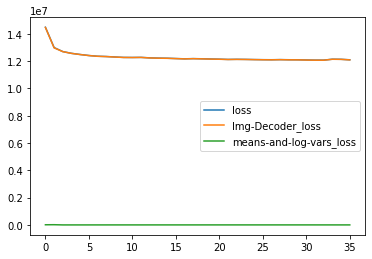

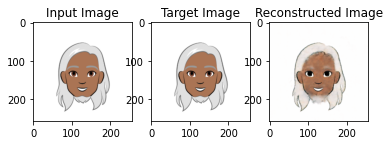

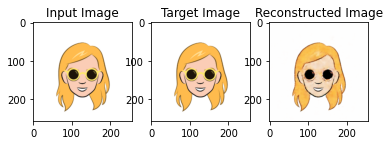

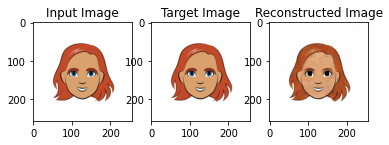

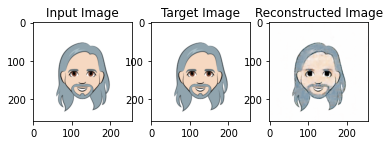

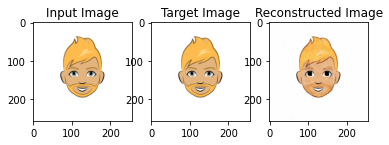

MSE Loss on input vs target:        0.0
MSE Loss on input vs reconstructed: 0.11434192955493927
Reconstruction Loss on input vs target:        11562913.0
Reconstruction Loss on input vs reconstructed: 12094193.0
KL Divergence Loss:                 316908.40625


In [ ]:
lr = 1e-3
mse_loss.factor = 1
kl_loss.factor = 1
kl_loss.beta = 1
vae = vae_model(input_shape_4_img)

run_training_session(vae, lr, epochs=50, min_delta=0, patience=3)

Epoch 1/50
157/157 [==============================] - 51s 315ms/step - loss: 12042607.0000 - Img-Decoder_loss: 12037607.0000 - means-and-log-vars_loss: 4998.2827
Epoch 2/50
157/157 [==============================] - 51s 322ms/step - loss: 12036848.0000 - Img-Decoder_loss: 12031984.0000 - means-and-log-vars_loss: 4865.4961
Epoch 3/50
157/157 [==============================] - 49s 312ms/step - loss: 12035727.0000 - Img-Decoder_loss: 12030965.0000 - means-and-log-vars_loss: 4758.0630
Epoch 4/50
157/157 [==============================] - 49s 310ms/step - loss: 12034929.0000 - Img-Decoder_loss: 12030255.0000 - means-and-log-vars_loss: 4674.3174
Epoch 5/50
157/157 [==============================] - 49s 311ms/step - loss: 12033487.0000 - Img-Decoder_loss: 12028890.0000 - means-and-log-vars_loss: 4596.7944
Epoch 6/50
157/157 [==============================] - 49s 309ms/step - loss: 12033263.0000 - Img-Decoder_loss: 12028735.0000 - means-and-log-vars_loss: 4532.5088
Epoch 7/50
157/157 [========

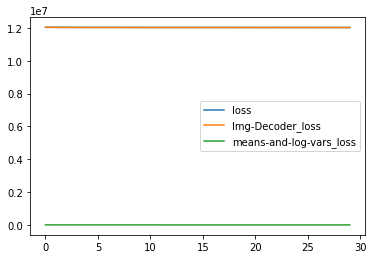

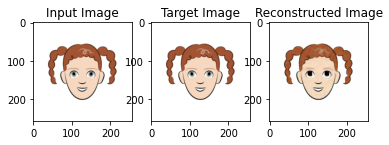

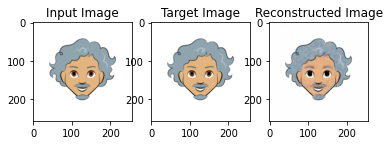

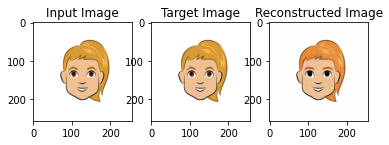

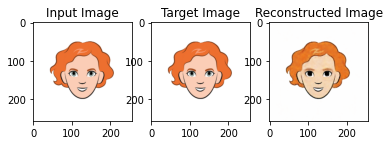

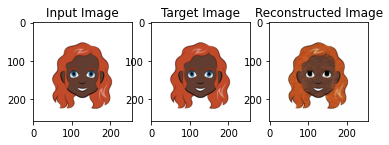

MSE Loss on input vs target:        0.0
MSE Loss on input vs reconstructed: 0.08630126714706421
Reconstruction Loss on input vs target:        11562913.0
Reconstruction Loss on input vs reconstructed: 12024594.0
KL Divergence Loss:                 242750.78125


In [ ]:
lr = 1e-4
run_training_session(vae, lr, epochs=50, min_delta=0, patience=3)

Epoch 1/50
157/157 [==============================] - 82s 502ms/step - loss: 12030743.0000 - Img-Decoder_loss: 12026946.0000 - means-and-log-vars_loss: 3797.5684
Epoch 2/50
157/157 [==============================] - 73s 466ms/step - loss: 12028888.0000 - Img-Decoder_loss: 12025193.0000 - means-and-log-vars_loss: 3691.5000
Epoch 3/50
157/157 [==============================] - 52s 330ms/step - loss: 12027088.0000 - Img-Decoder_loss: 12023490.0000 - means-and-log-vars_loss: 3591.3357
Epoch 4/50
157/157 [==============================] - 50s 320ms/step - loss: 12026584.0000 - Img-Decoder_loss: 12023084.0000 - means-and-log-vars_loss: 3499.8865
Epoch 5/50
157/157 [==============================] - 50s 320ms/step - loss: 12027466.0000 - Img-Decoder_loss: 12024023.0000 - means-and-log-vars_loss: 3443.4016
Epoch 6/50
157/157 [==============================] - 52s 329ms/step - loss: 12024525.0000 - Img-Decoder_loss: 12021164.0000 - means-and-log-vars_loss: 3361.1040
Epoch 7/50
157/157 [========

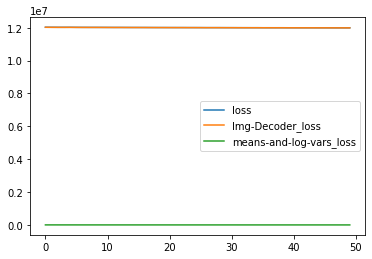

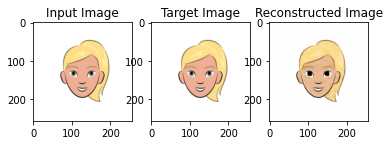

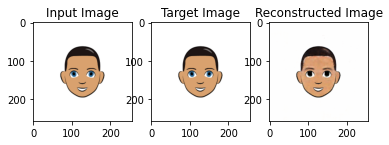

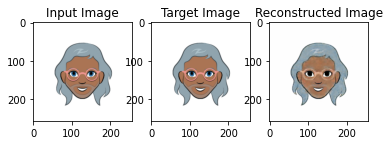

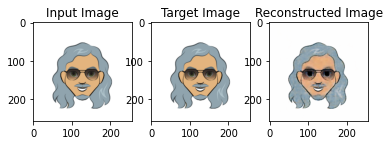

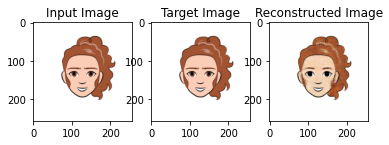

MSE Loss on input vs target:        0.0
MSE Loss on input vs reconstructed: 0.08002543449401855
Reconstruction Loss on input vs target:        11562913.0
Reconstruction Loss on input vs reconstructed: 12007520.0
KL Divergence Loss:                 137429.421875


In [ ]:
lr = 1e-5
run_training_session(vae, lr, epochs=50, min_delta=0, patience=3)

Epoch 1/50
157/157 [==============================] - 51s 316ms/step - loss: 11992591.0000 - Img-Decoder_loss: 11990449.0000 - means-and-log-vars_loss: 2145.2263
Epoch 2/50
157/157 [==============================] - 48s 307ms/step - loss: 11992793.0000 - Img-Decoder_loss: 11990662.0000 - means-and-log-vars_loss: 2133.8528
Epoch 3/50
157/157 [==============================] - 49s 309ms/step - loss: 11991915.0000 - Img-Decoder_loss: 11989785.0000 - means-and-log-vars_loss: 2126.2378
Epoch 4/50
157/157 [==============================] - 50s 318ms/step - loss: 11991677.0000 - Img-Decoder_loss: 11989557.0000 - means-and-log-vars_loss: 2118.2581
Epoch 5/50
157/157 [==============================] - 48s 306ms/step - loss: 11991781.0000 - Img-Decoder_loss: 11989666.0000 - means-and-log-vars_loss: 2110.9116
Epoch 6/50
157/157 [==============================] - 48s 307ms/step - loss: 11991327.0000 - Img-Decoder_loss: 11989224.0000 - means-and-log-vars_loss: 2106.3867
Epoch 7/50
157/157 [========

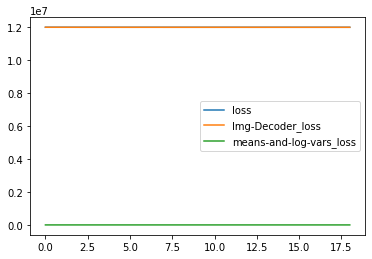

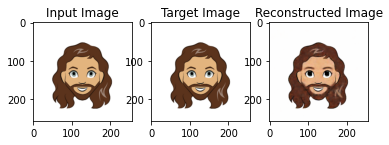

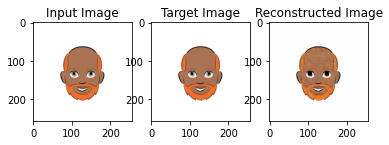

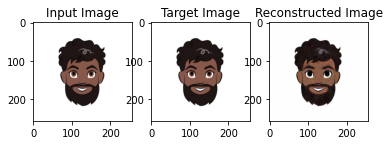

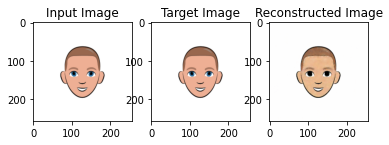

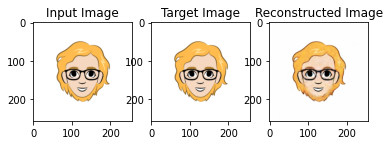

MSE Loss on input vs target:        0.0
MSE Loss on input vs reconstructed: 0.07825382798910141
Reconstruction Loss on input vs target:        11562913.0
Reconstruction Loss on input vs reconstructed: 12002575.0
KL Divergence Loss:                 131814.984375


In [ ]:
lr = 1e-6
run_training_session(vae, lr, epochs=50, min_delta=0, patience=3)

In [ ]:
lr = 1e-7
run_training_session(vae, lr, epochs=50, min_delta=0, patience=3)

Epoch 1/50
157/157 [==============================] - 51s 317ms/step - loss: 11990354.0000 - Img-Decoder_loss: 11988291.0000 - means-and-log-vars_loss: 2061.1926


In [ ]:
lr = 5e-8
run_training_session(vae, lr, epochs=50, min_delta=0, patience=3)

In [ ]:
SAVE_WEIGHTS = True

if SAVE_WEIGHTS:
    p2drive = Path('/content/gdrive/MyDrive/Tensorflow/VAE/training_weights_good')
    name_seed = 'cartoon-sigma-loss_xx'
    p2encfile = p2drive/f"{name_seed}_enc_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5"
    p2decfile = p2drive/f"{name_seed}_dec_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5"
    p2vaefile = p2drive/f"{name_seed}_vae_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5"
    img_enc.save_weights(p2encfile)
    img_dec.save_weights(p2decfile)
    vae.save_weights(p2vaefile)
    print(f"Saved vae, encoder and decoder in {p2drive.absolute()} as:")
    print(f"- {p2vaefile.name}")
    print(f"- {p2encfile.name}")
    print(f"- {p2decfile.name}")    

In [ ]:
p2goodmodels = Path('/content/gdrive/MyDrive/Tensorflow/VAE/training_weights_good/')
p2enc = p2goodmodels/'cartoon_enc_sigma_loss_12172029_220626-1250-UTC.h5'
p2dec = p2goodmodels/'cartoon_dec_sigma_loss_12172029_220626-1250-UTC.h5'

vae = vae_model(input_shape_4_img, p2enc=p2enc, p2dec=p2dec)

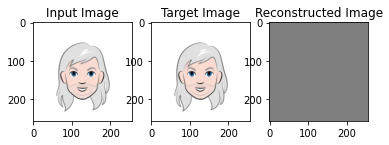

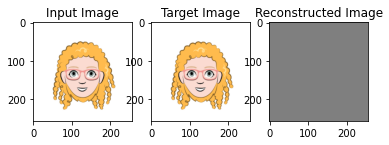

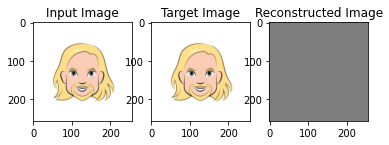

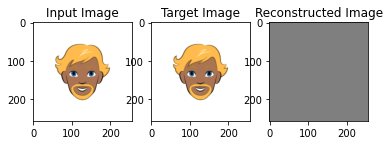

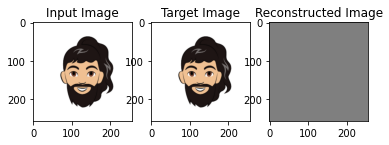

MSE Loss on input vs target:        0.0
MSE Loss on input vs reconstructed: 13.438310623168945
Reconstruction Loss on input vs target:        11562913.0
Reconstruction Loss on input vs reconstructed: 16930728.0
KL Divergence Loss:                 66.76826477050781


In [ ]:
illustrate_performance(vae)

#### Experiment 2
- factor MSE = 100
- lr: 5e-4, 1e-4, 1e-5, 1e-6

Epoch 1/25
157/157 [==============================] - 54s 332ms/step - loss: 31.4204 - Img-Decoder_loss: 13.0154 - means-and-log-vars_loss: 18.4051
Epoch 2/25
157/157 [==============================] - 52s 331ms/step - loss: 6.5410 - Img-Decoder_loss: 5.5927 - means-and-log-vars_loss: 0.9484
Epoch 3/25
157/157 [==============================] - 53s 339ms/step - loss: 4.4447 - Img-Decoder_loss: 3.8359 - means-and-log-vars_loss: 0.6088
Epoch 4/25
157/157 [==============================] - 52s 330ms/step - loss: 3.6780 - Img-Decoder_loss: 3.2682 - means-and-log-vars_loss: 0.4099
Epoch 5/25
157/157 [==============================] - 52s 327ms/step - loss: 3.2929 - Img-Decoder_loss: 2.9873 - means-and-log-vars_loss: 0.3056
Epoch 6/25
157/157 [==============================] - 54s 341ms/step - loss: 3.1665 - Img-Decoder_loss: 2.9012 - means-and-log-vars_loss: 0.2653
Epoch 7/25
157/157 [==============================] - 52s 329ms/step - loss: 3.1143 - Img-Decoder_loss: 2.8534 - means-and-log-

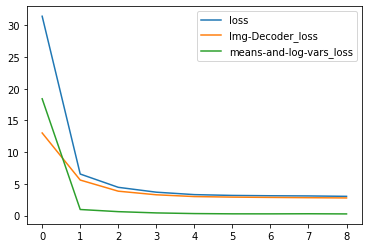

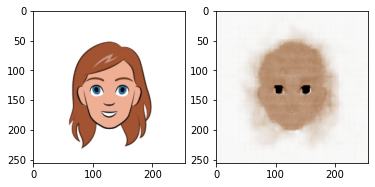

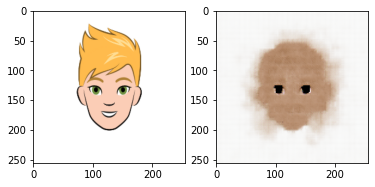

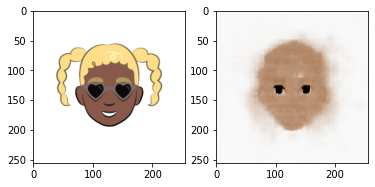

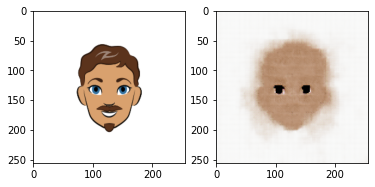

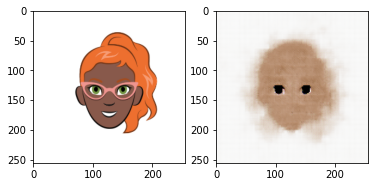

MSE Loss on input vs target:        192.0856170654297
MSE Loss on input vs reconstructed: 188.42080688476562
KL Divergence Loss:                 81.01495361328125
Saved encoder and decoder as:
- cartoon-keras_enc_intermediate_220625-1523-UTC.h5
- cartoon-keras_dec_intermediate_220625-1523-UTC.h5


In [ ]:
lr = 5e-4
mse_loss.factor = 100
vae = vae_model(input_shape_4_img)
run_training_session(vae, lr, epochs=25, min_delta=5e-1, patience=3, save_weights=True)

Epoch 1/25
157/157 [==============================] - 56s 344ms/step - loss: 3.2061 - Img-Decoder_loss: 2.8568 - means-and-log-vars_loss: 0.3494
Epoch 2/25
157/157 [==============================] - 52s 330ms/step - loss: 2.9041 - Img-Decoder_loss: 2.8330 - means-and-log-vars_loss: 0.0711
Epoch 3/25
157/157 [==============================] - 52s 333ms/step - loss: 2.8786 - Img-Decoder_loss: 2.8179 - means-and-log-vars_loss: 0.0607
Epoch 4/25
157/157 [==============================] - 54s 344ms/step - loss: 2.8586 - Img-Decoder_loss: 2.8010 - means-and-log-vars_loss: 0.0576
Epoch 4: early stopping


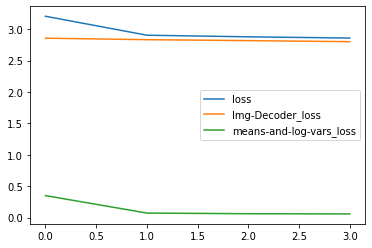

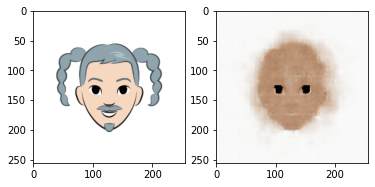

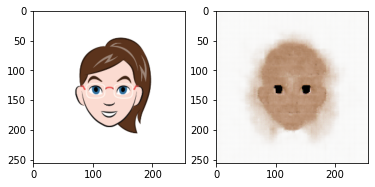

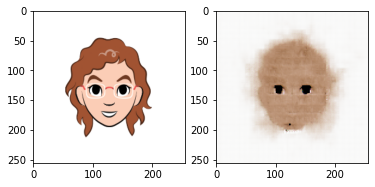

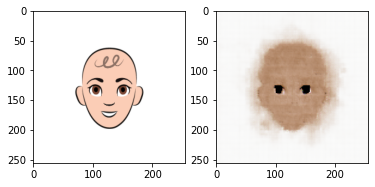

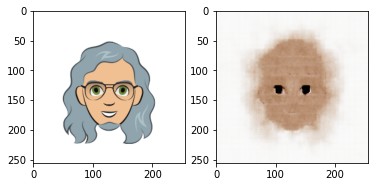

MSE Loss on input vs target:        171.39532470703125
MSE Loss on input vs reconstructed: 173.8909912109375
KL Divergence Loss:                 138.27645874023438
Saved encoder and decoder as:
- cartoon-keras_enc_intermediate_220625-1528-UTC.h5
- cartoon-keras_dec_intermediate_220625-1528-UTC.h5


In [ ]:
lr = 1e-4
run_training_session(vae, lr, epochs=25, min_delta=5e-1, patience=3, save_weights=True)

In [ ]:
lr = 1e-5
run_training_session(vae, lr, epochs=25, min_delta=5e-1, patience=3, save_weights=True)

Epoch 1/25
157/157 [==============================] - 53s 327ms/step - loss: 2.9067 - Img-Decoder_loss: 2.8431 - means-and-log-vars_loss: 0.0635
Epoch 2/25
 38/157 [======>.......................] - ETA: 39s - loss: 2.9334 - Img-Decoder_loss: 2.8750 - means-and-log-vars_loss: 0.0584

In [ ]:
lr = 1e-6
run_training_session(vae, lr, epochs=25, min_delta=5e-1, patience=3, save_weights=True)

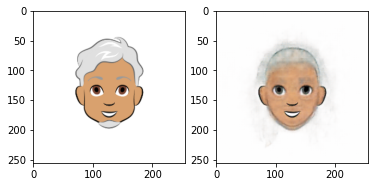

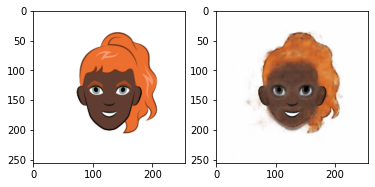

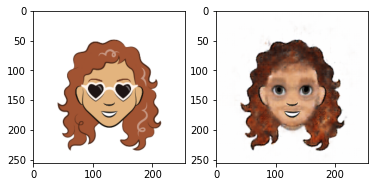

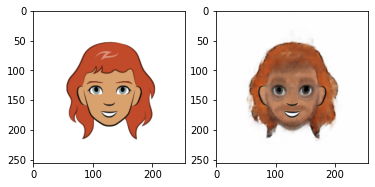

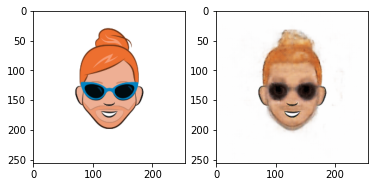

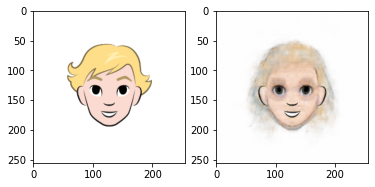

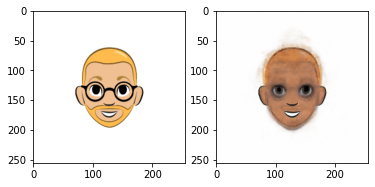

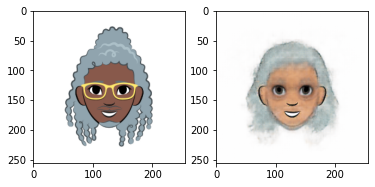

MSE Loss on input vs target:        714.0277099609375
MSE Loss on input vs reconstructed: 752.3013916015625
KL Divergence Loss:                 461.49627685546875


In [ ]:
for element in train_ds.take(1):
    img_in, (_, means_and_log_vars) = element
    img_out, _ = vae(img_in)
    for n in range(8):
        plt.figure()
        plt.subplot(1, 2, 1)
        plt.imshow(img_in[n, :, :, :])
        plt.subplot(1, 2, 2)
        plt.imshow(img_out[n, :, :, :])
        plt.show()
    img_rec, malv = vae(img_in)
    print(f"MSE Loss on input vs target:        {mse_loss(img_in, img_out).numpy().sum()}")
    print(f"MSE Loss on input vs reconstructed: {mse_loss(img_in, img_rec).numpy().sum()}")
    print(f"KL Divergence Loss:                 {kl_loss(means_and_log_vars, malv).numpy().sum()}")

In [ ]:
SAVE_MODEL = True
name_seed = 'cartoon-keras'
if not SAVE_MODEL:
    print('If <SAVE_MODEL> set True, will save encoder and decoder as:')
    print(f"- {name_seed}_enc_final_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5")
    print(f"- {name_seed}_dec_final_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5")
else: 
    img_enc.save_weights(p2drive/f"{name_seed}_enc_final_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5")
    img_dec.save_weights(p2drive/f"{name_seed}_dec_final_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5")
    print('Saved encoder and decoder as:')
    print(f"- {name_seed}_enc_final_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5")
    print(f"- {name_seed}_dec_final_{datetime.now().strftime('%y%m%d-%H%M-UTC')}.h5")

Saved encoder and decoder as:
- cartoon-keras_enc_final_220625-0915-UTC.h5
- cartoon-keras_dec_final_220625-0915-UTC.h5


In [ ]:
lr = 5e-4

# vae = vae_model(input_shape_4_img)

optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
vae.compile(
    optimizer=optimizer,
    loss=[mse_loss, kl_loss]
)

es = EarlyStopping(
    monitor='loss',
    min_delta= 5e-2,
    patience=5,
    verbose=1,
    mode='min',
    restore_best_weights=True
)

hist = vae.fit(
    x=train_ds,
    epochs=10,
    callbacks=[es],
    verbose=1
)

pd.DataFrame(hist.history).plot();

Epoch 1/10
157/157 [==============================] - 69s 428ms/step - loss: 15.5630 - Img-Decoder_loss: 10.0444 - means-and-log-vars_loss: 5.5186
Epoch 2/10
157/157 [==============================] - 76s 484ms/step - loss: 15.2728 - Img-Decoder_loss: 9.7675 - means-and-log-vars_loss: 5.5052
Epoch 3/10
157/157 [==============================] - 73s 466ms/step - loss: 15.1704 - Img-Decoder_loss: 9.6231 - means-and-log-vars_loss: 5.5473
Epoch 4/10
 83/157 [==============>...............] - ETA: 31s - loss: 15.0182 - Img-Decoder_loss: 9.4981 - means-and-log-vars_loss: 5.5200

KeyboardInterrupt: ignored

# Explore latent space and reconstruction

## Latent Space Projection with t-SNE

First, build a latent space,
- sample `n_to_show` images, 
- calculate mean and log_var, 
- sample the embedding for each image.

In [ ]:
n_to_show = 5000

embeddings, means, log_vars = None, None, None

for img_b in normalized_ds:
    m, v = enc.predict(img_b)
    means = np.concatenate((means, m)) if means is not None else m
    log_vars = np.concatenate((log_vars, v)) if log_vars is not None else v

    embeds = sampler.predict([m,v])
    embeddings = np.concatenate((embeddings, embeds)) if embeddings is not None else embeds

    if embeddings.shape[0] > n_to_show:
        break

embeddings.shape, means.shape, log_vars.shape

((5120, 200), (5120, 200), (5120, 200))

Then, apply t-sne on the resulting laten space vectors (`embeddings`) to reduce the dimensioins to 2 and plot it. Test several perplexities and pick one that shows some kind of clustering.

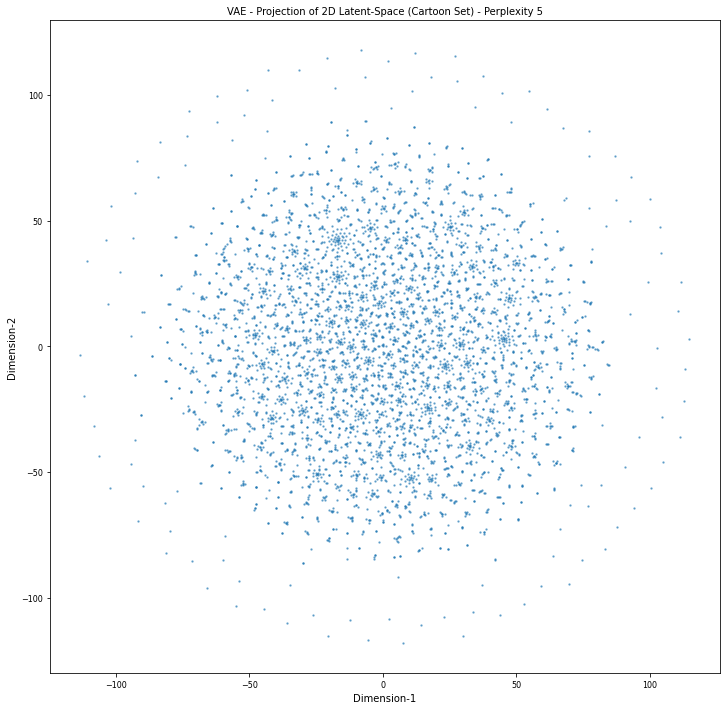

In [ ]:
n_to_show = 5000
grid_size = 15
figsize = 12

perplexity = 5      # between 5 and 50. low values show some clustering for this dataset

tsne = TSNE(n_components=2, init='pca', perplexity=perplexity, random_state=0)
X_tsne = tsne.fit_transform(embeddings)

min_x = min(X_tsne[:, 0])
max_x = max(X_tsne[:, 0])
min_y = min(X_tsne[:, 1])
max_y = max(X_tsne[:, 1])


plt.figure(figsize=(figsize, figsize))
plt.scatter(X_tsne[:, 0] , X_tsne[:, 1], alpha=0.5, s=2)
plt.xlabel("Dimension-1", size=10)
plt.ylabel("Dimension-2", size=10)
plt.xticks(size=8)
plt.yticks(size=8)
plt.title(f"VAE - Projection of 2D Latent-Space (Cartoon Set) - Perplexity {perplexity}", size=10)
plt.show()

## Reconstructing original cartoon images

- select a number of images
- sample corresponding latent space vectors a.k.a. embeddings
- reconstruct images from the embeddings
- plot the reconstructed images next to the corresponding original images

In [ ]:
n_to_show = 2500

imgs_to_show, reconstruction, lat_space = None, None, None

for img_b in normalized_ds:
    imgs_to_show = np.concatenate((imgs_to_show, img_b)) if imgs_to_show is not None else img_b

    m,v = enc.predict(img_b)
    latent = sampler([m,v])
    lat_space = np.concatenate((lat_space, latent)) if lat_space is not None else latent
    lat_space_min = lat_space.min(axis=0)
    lat_space_max = lat_space.max(axis=0)

    out = dec.predict(latent)
    reconstruction = np.concatenate((reconstruction, out)) if reconstruction is not None else out

    if reconstruction.shape[0] > n_to_show:
        break
imgs_to_show.shape, reconstruction.shape, lat_space.shape

((2560, 256, 256, 3), (2560, 256, 256, 3), (2560, 200))

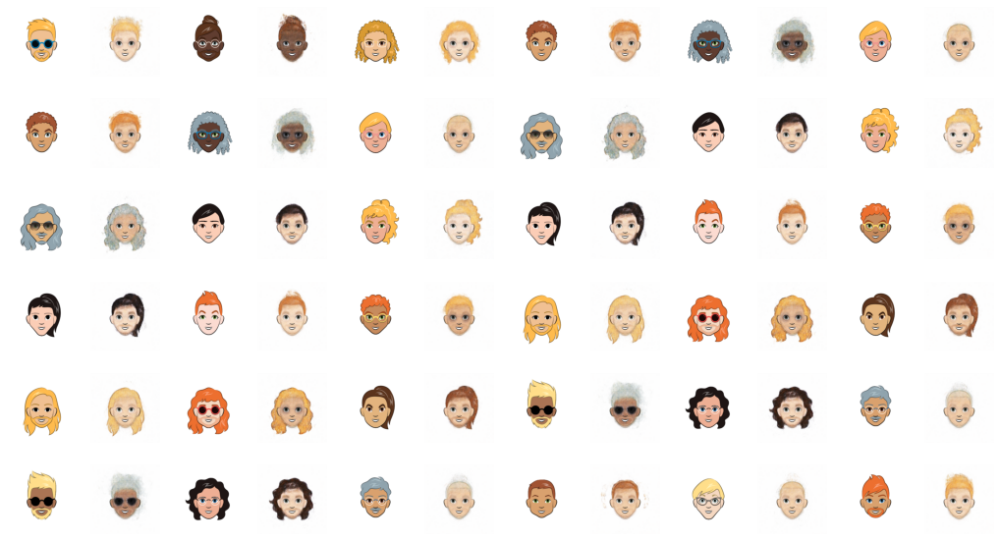

In [ ]:
n = 6
figsize = 18

fig, axs = plt.subplots(nrows=n, ncols=2*n, figsize=(figsize, 10))
for i, row in enumerate(axs):
    for j in range(0, 2*n-1, 2): 
        row[j].imshow(imgs_to_show[i*n + j, :, :, :])
        row[j].axis('off')

        pred = reconstruction[i*n + j, :, :, :] * 255
        pred = np.array(pred)  
        pred = pred.astype(np.uint8)
        row[j+1].imshow(pred)
        row[j+1].axis('off')

plt.show()

## Reconstructing from a normal distribution

- Create a set of random vectors in latent space, by sampling from a $N(0, 1)$ distribution
- Decoding each random latent vector into an image 
- Plot the images

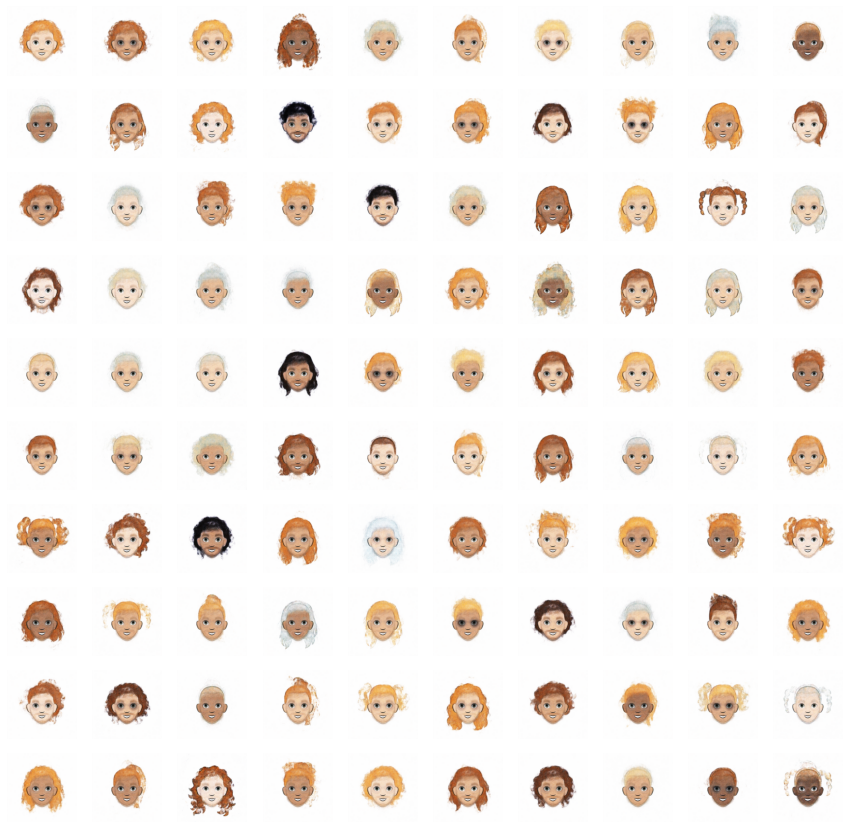

In [ ]:
n = 10
figsize = 15

x = np.random.normal(size = (n * n , 200))
reconstruct = dec.predict(x)

fig = plt.figure(figsize=(figsize, figsize))

for i in range(n * n):
    ax = fig.add_subplot(n, n, i+1)
    ax.axis('off')
    pred = reconstruct[i, :, :, :] * 255
    pred = np.array(pred)  
    pred = pred.astype(np.uint8)
    ax.imshow(pred)

## Reconstructing from a uniform distribution

- Create a set of random vectors in latent space, by sampling from a uniform distribution
- Decoding each random latent vector into an image 
- Plot the images

(25, 200)


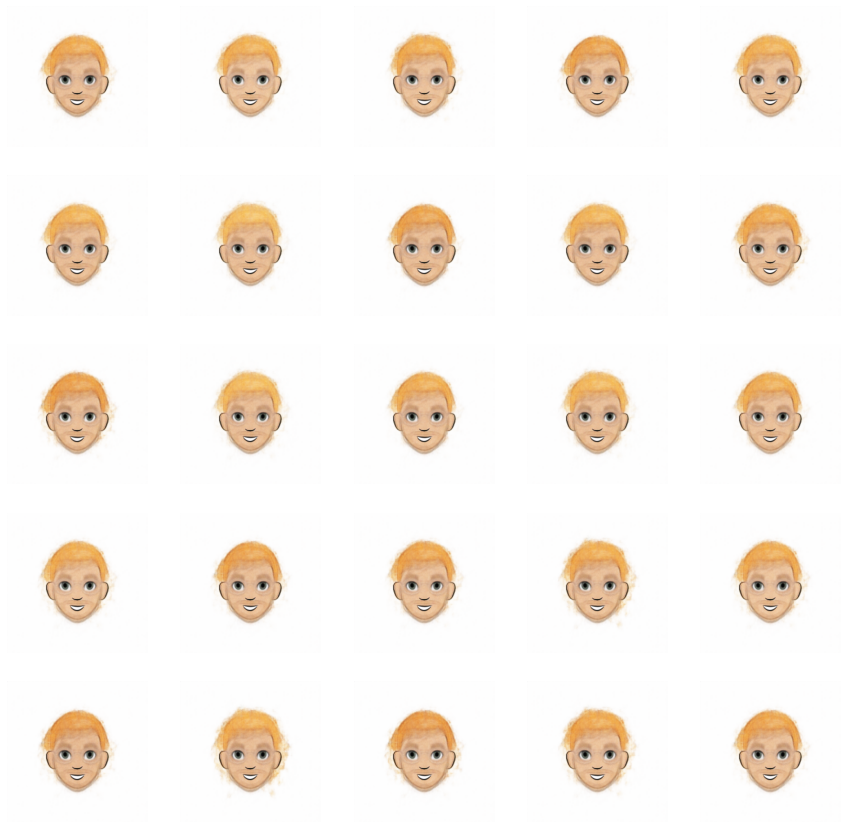

In [ ]:
n = 5
figsize = 15


x = np.random.uniform(size = (n * n,200))
print(x.shape)

# Scaling x to match the original image space area
min_x = lat_space_min   # defined in section Reconstructing original cartoon images
max_x = lat_space_max
x = x * (max_x - (np.abs(min_x))) 

reconstruct = dec.predict(x)


fig = plt.figure(figsize=(figsize, figsize))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

for i in range(n * n):
    ax = fig.add_subplot(n, n, i+1)
    ax.axis('off')
    pred = reconstruct[i, :, :, :] * 255
    pred = np.array(pred)  
    pred = pred.astype(np.uint8)
    ax.imshow(pred)

## Reconstruct from latent space vector on a grid
Reconstruct images from latent vectors positioned on a regular grid in the latent space. As we have 200 dimensions, we will do that on the 2 first principal components of embeddings

- Sample original images, save them into `imgs_to_show` and sample the corresponding latent-vectors `embeddings`
- Apply PCA to embeddings to allow a reduction to 2 dimensions
- Take values for two principal components on a square grid (`pc_1` and `pc_2`) from min to max and for a fixed number of images
- Inverse transform the grid-PCs into latent vectors from `pc_1` and `pc_2`
- 

In [ ]:
n_to_show = 5000

imgs_to_show, embeddings = None, None

for img_b in normalized_ds:
    imgs_to_show = np.concatenate((imgs_to_show, img_b)) if imgs_to_show is not None else img_b

    m, v = enc.predict(img_b)
    embeds = sampler.predict([m,v])
    embeddings = np.concatenate((embeddings, embeds)) if embeddings is not None else embeds
    print(imgs_to_show.shape, embeddings.shape)
    dispmod.clear_output(wait=True)
    if embeddings.shape[0] > n_to_show:
        break

imgs_to_show.shape, embeddings.shape

((5120, 256, 256, 3), (5120, 200))

(5120, 2)


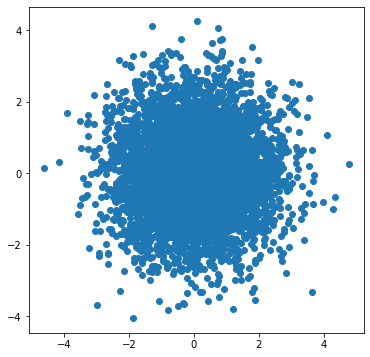

((5120, 2), (5120, 200))

In [ ]:
pca = PCA(n_components=2)
embs_pcs = pca.fit_transform(X=embeddings)
print(embs_pcs.shape)

figsize = 6
fig, ax = plt.subplots(1, 1, figsize=(figsize,figsize))
ax.scatter(embs_pcs[:, 0], embs_pcs[:, 1])
plt.show()

# inverse_transform approximates the embeddings from the the two principal components
target_latent_vectors = pca.inverse_transform(embs_pcs)
embs_pcs.shape, target_latent_vectors.shape

In [ ]:
n = 10

min_pc1 = min(embs_pcs[:, 0])
max_pc1 = max(embs_pcs[:, 0])
min_pc2 = min(embs_pcs[:, 1])
max_pc2 = max(embs_pcs[:, 1])

pc1 = np.reshape(np.linspace(start=min_pc1, stop=max_pc1, num=n), (n, 1))
pc2 = np.reshape(np.linspace(start=min_pc2, stop=max_pc2, num=n), (n, 1))

pc1_grid, pc2_grid = np.meshgrid(pc1, pc2)

pc1_1dim = np.reshape(pc1_grid, (n*n, 1))
pc2_1dim = np.reshape(pc2_grid, (n*n, 1))

print(pc1_1dim.shape, pc2_1dim.shape)

grid_pcs = np.concatenate((pc1_1dim, pc2_1dim), axis=1)
print(grid_pcs.shape, pca.inverse_transform(grid_pcs).shape)

reconst = dec.predict(pca.inverse_transform(grid_pcs))
reconst.shape

(100, 1) (100, 1)
(100, 2) (100, 200)


(100, 256, 256, 3)

Showing 100 reconstructed images from latent vectors positioned on a regular grid in the latent space


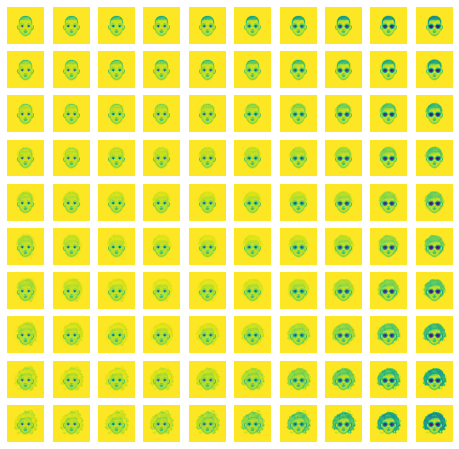

In [ ]:
print(f"Showing {n*n} reconstructed images from latent vectors positioned on a regular grid in the latent space")
fig, axs = plt.subplots(n, n, figsize = (8,8))
for r, rows in enumerate(axs):
    for c, ax in enumerate(rows):
        ax.imshow(reconst[r * n + c, :, :, 0])
        ax.set_axis_off()
# plt.suptitle(f"Showing {n*n} linearly transformed images")
plt.show();

## Reconstruct on grid and add real images
Bring images on a grid and latent space classification on the same plot

Prepare to display latent space for the data set

In [ ]:
gc.collect()

129

In [ ]:
n_batches = 4

# Take several batches of real images and: (1) calculate the embeddings in the latent space and (2) keep track of the original images

imgs_to_show, embeddings, means, log_vars = None, None, None, None
for img_b in normalized_ds.take(n_batches):
    imgs_to_show = np.concatenate((imgs_to_show, img_b)) if imgs_to_show is not None else img_b
    m, v = enc.predict(img_b)
    embeds = sampler([m,v])
    embeddings = np.concatenate((embeddings, embeds)) if embeddings is not None else embeds
    print(embeddings.shape, imgs_to_show.shape)
    dispmod.clear_output(wait=True)
    
embeddings.shape, imgs_to_show.shape

((512, 200), (512, 256, 256, 3))

In [ ]:
embs_pcs = pca.transform(embeddings)

min_pc1 = min(embs_pcs[:, 0])
max_pc1 = max(embs_pcs[:, 0])
min_pc2 = min(embs_pcs[:, 1])
max_pc2 = max(embs_pcs[:, 1])

min_pc1, max_pc1, min_pc2, max_pc2

(-3.2407045, 3.62242, -2.7410061, 3.1653183)

Prepare the grid image generated from a regular grid sampling of the latent space

In [ ]:
def make_grid_image(images, n):
    """Place n * n images into a large grid image""" 
    grid_img = np.empty((n * 256, n * 256, 3), dtype='float32')
    
    assert images.shape[0] == n * n, f"{images.shape[0]} images is not compatible with {n}"
    for i in range(n):
        for j in range(n):
            grid_img[i*256:(i+1)*256,j*256:(j+1)*256,:] = images[i*n+j, :, :, :].copy()
    return grid_img

In [ ]:
n = 10

pc1 = np.reshape(np.linspace(start=min_pc1, stop=max_pc1, num=n), (n, 1))
pc2 = np.reshape(np.linspace(start=min_pc2, stop=max_pc2, num=n), (n, 1))

pc1_grid, pc2_grid = np.meshgrid(pc1, pc2)
pc1_1dim = np.reshape(pc1_grid, (n*n, 1))
pc2_1dim = np.reshape(pc2_grid, (n*n, 1))

grid_pcs = np.concatenate((pc1_1dim, pc2_1dim), axis=1)

reconst = dec.predict(pca.inverse_transform(grid_pcs))

grid_reconst = make_grid_image(reconst, n)

reconst.shape, grid_reconst.shape

((100, 256, 256, 3), (2560, 2560, 3))

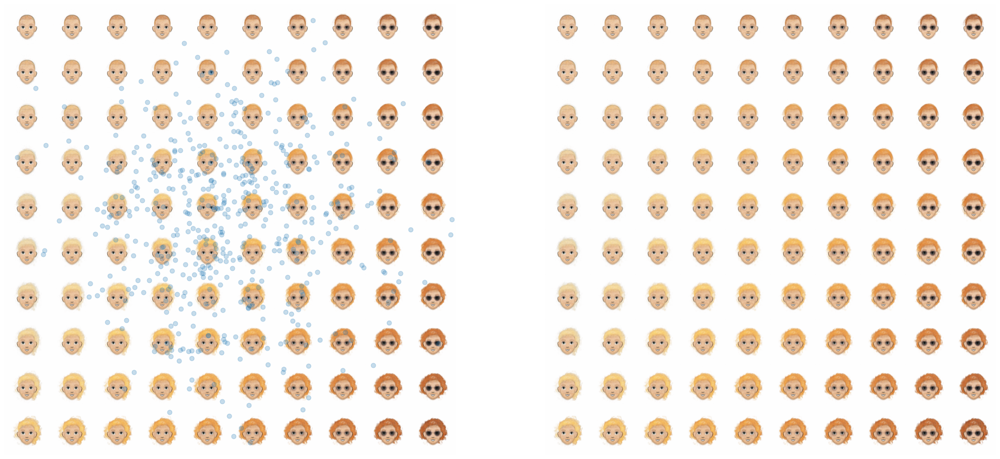

In [ ]:
scaling_pc1 = 256 * n / (max_pc1 - min_pc1)
scaling_pc2 = 256 * n / (max_pc2 - min_pc2)
ctr_pc1 = (max_pc1-min_pc1)/2 * scaling_pc1
ctr_pc2 = (max_pc2-min_pc2)/2 * scaling_pc2

_, axs = plt.subplots(nrows=1, ncols=2, figsize=(28,14))
axs[0].scatter(embs_pcs[:, 0]*scaling_pc1+ctr_pc1 , embs_pcs[:, 1]*scaling_pc2+ctr_pc2, alpha=0.25, s=5*n)
axs[0].imshow(np.reshape(grid_reconst, (n * 256, n * 256, 3)))
axs[1].imshow(np.reshape(grid_reconst, (n * 256, n * 256, 3)))
axs[0].set_axis_off()
axs[1].set_axis_off()
plt.show();

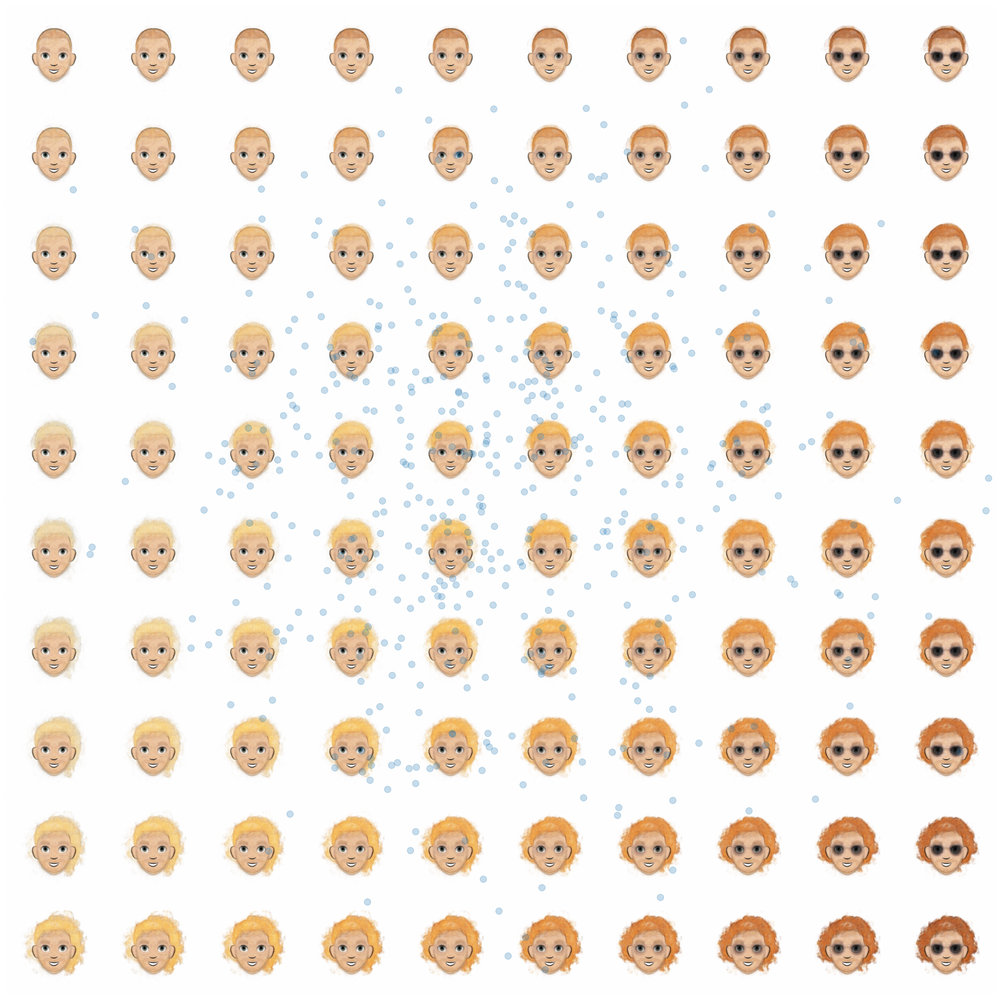

In [ ]:
scaling_pc1 = 256 * n / (max_pc1 - min_pc1)
scaling_pc2 = 256 * n / (max_pc2 - min_pc2)
ctr_pc1 = (max_pc1-min_pc1)/2 * scaling_pc1
ctr_pc2 = (max_pc2-min_pc2)/2 * scaling_pc2

_, axs = plt.subplots(nrows=1, ncols=1, figsize=(28,28))
axs.scatter(embs_pcs[:, 0]*scaling_pc1+ctr_pc1 , embs_pcs[:, 1]*scaling_pc2+ctr_pc2, alpha=0.25, s=10*n)
axs.imshow(np.reshape(grid_reconst, (n * 256, n * 256, 3)))
axs.set_axis_off()
plt.show();

## Add resized original images with transparency to reconstructed grid_image

Plotting reconstructed grid and position 100 original images on the grid


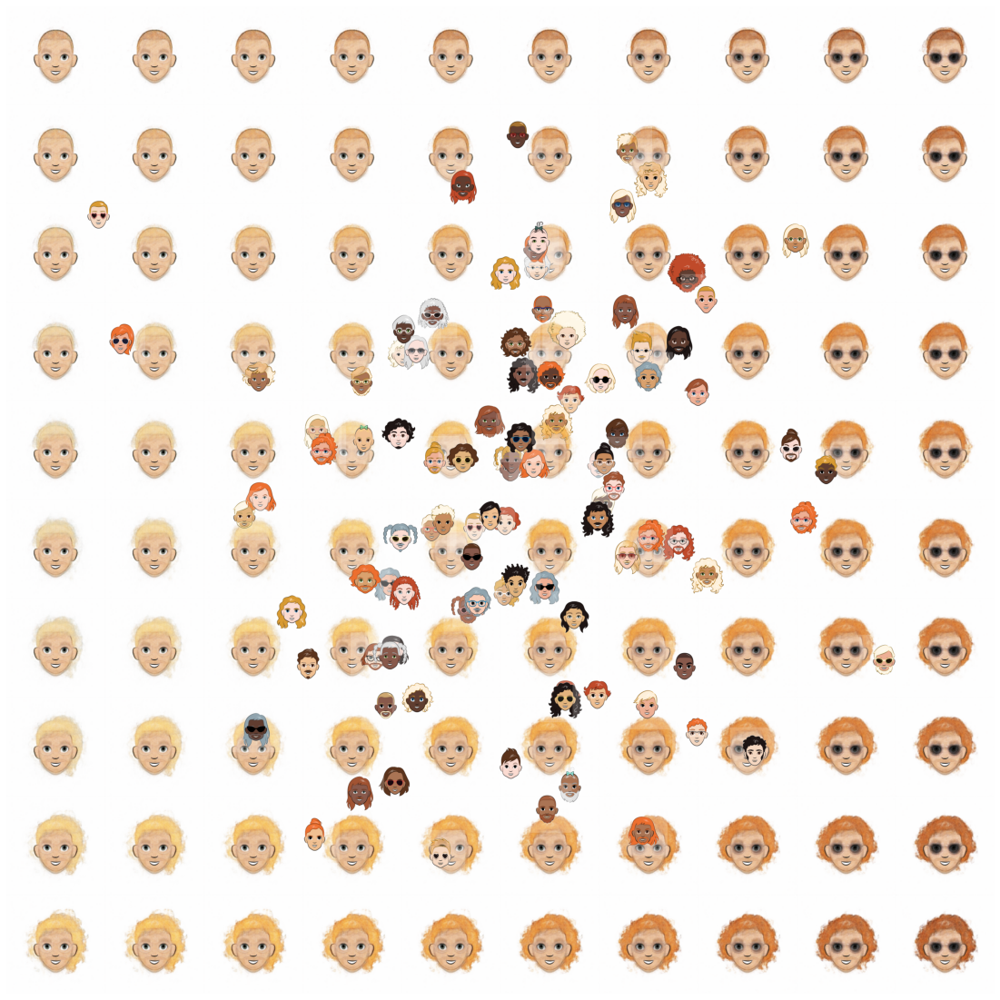

In [ ]:
def insert_img(large_img, img, x, y):
    large_img.paste(img, box=(x, y), mask=img)
    return large_img

def nparray2rgba(im):
    """Convert into PIL image with alpha channel = 0 where background is white"""
    # Create alpha channel
    alpha = np.where(im == [1, 1, 1], 0.2, 1)
    alpha = alpha[:, :, 0]
    # Add the alpha layer into the original image, to have 4 channels
    im_rgba = np.concatenate((im, np.reshape(alpha, (im.shape[0], im.shape[1], 1))), axis=2)
    # convert into RGBA PIL image
    im_pil = Image.fromarray(np.uint8(im_rgba * 255), mode='RGBA')
    resizing_fctr = 2
    # im_pil = im_pil.resize(size=(int(im_pil.size[0]/resizing_fctr),int(im_pil.size[1]/resizing_fctr)))
    im_pil = im_pil.reduce(resizing_fctr)
    return im_pil

n_originals = 100

grid_w_original = Image.fromarray(np.uint8(grid_reconst * 255), mode='RGB')
print(grid_w_original.getbands(), grid_w_original.size)

img_idx = np.random.choice(imgs_to_show.shape[0], size=(n_originals))
for i, im in enumerate(imgs_to_show[img_idx]):
    x = int(embs_pcs[i, 0] * scaling_pc1 + ctr_pc1 )
    y = int(embs_pcs[i, 1] * scaling_pc2 + ctr_pc2)
    print(i, x, y, im.shape)
    dispmod.clear_output(wait=True)
    grid_w_original = insert_img(grid_w_original, nparray2rgba(im), x, y)

_, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,20))
ax.imshow(grid_w_original)
ax.set_axis_off()
print(f"Plotting reconstructed grid and position {n_originals} original images on the grid")
plt.show();

## Ideas for further improving

1. Add a classifier/regressor: The dataset includes features such as "eye_angle", "eye_lashes", "eye_lid", "chin_length", "facial_hair", "hair_color". If we also train the model to ge a good classifier and/or regressor, the representation may be better in terms if how it differentiate the features

# Sandbox

## Play with masks

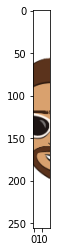

(256, 20, 3)

In [ ]:
# View relation between dimensions and H, W
# Shape (m, n) means height of m and width of n
plt.imshow(imgs_to_show[1,0:256,100:120,:])
plt.show();
imgs_to_show[1,0:256,100:120,:].shape

In [ ]:
def insert_img(large_img, img, x, y):
    lh, lw, sh, sw = large_img.shape[0], large_img.shape[1], img.shape[0], img.shape[1]
    assert lw > sw
    assert lh > sh
    assert x <= lh-sw
    assert y <= lw-sh
    # print(f"{y}:{y+sh}, {x}:{x+sw}, :")
    large_img[y:y+sh, x:x+sw, :] = img
    return large_img

# s_img = imgs[2,50:150,100:120,:].copy()
# new_img = insert_img(imgs[5].copy(), s_img, 256-20, 20)
# plt.imshow(new_img)
# plt.show();

In [ ]:
imgs_to_show.shape

(512, 256, 256, 3)

## Play with alpha channel and `PIL`

Use `PIL.Image` to add original images with transparent background over `grid_reconst`:
- convert `grid_reconst` into an array with integers between 0 and 255
- create `im_grid`, as a `PIL.Image` object of mode RGB
- add an alpha layer 1 where original color is white
- for each original photo:
    - convert into a `PIL.Image`
    - add an alpha layer, active where background is white
    - insert the image into `grid_reconst

In [ ]:
alpha_shape = (grid_reconst.shape[0], grid_reconst.shape[1], 1)
grid_rgba = np.concatenate([grid_reconst, np.ones(shape=alpha_shape) * 1], axis=2)
grid_reconst4pil = np.uint8(grid_rgba * 255)
im_grid = Image.fromarray(grid_reconst4pil, mode='RGBA')
im_grid

### Load a PIL.Image from np array: 
1. Scale the pixel values in each channel to [0-255]
2. Convert values into `int8`
3. Load images with `Image.fromarray(nparray, mode='RGB')`

('R', 'G', 'B')


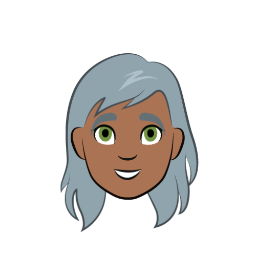

In [ ]:
# Load a PIL.Image from np array: scale to 0-255; convert into int8, load from array
original4pil = np.uint8(imgs_to_show[0] * 255)
im_original = Image.fromarray(original4pil, mode='RGB')
print(im_original.getbands())
im_original

(256, 256, 3)
(256, 256)


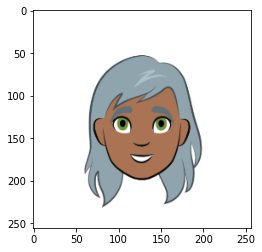

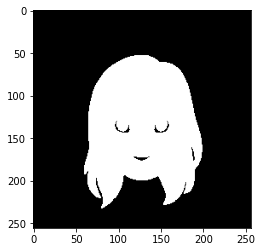

In [ ]:
# Create a alpha layer = 0 where background is white
imo = imgs_to_show[0, :, :, :]

alpha = np.where(imo == [1, 1, 1], 0, 1)
print(alpha.shape)
alpha = alpha[:, :, 0]
print(alpha.shape)
plt.imshow(imo); plt.axi plt.show()
plt.imshow(alpha * 255, cmap='Greys_r'); plt.show()

(256, 256, 4)


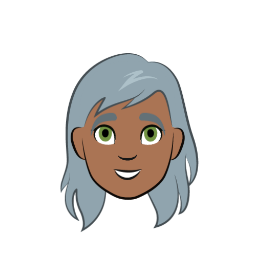

In [ ]:
# Add the alpha layer into the original image, to have 4 channels
imo_a = np.concatenate((imo, np.reshape(alpha, (256, 256, 1))), axis=2)
imo_a_4pil = np.uint8(imo_a * 255)
print(imo_a_4pil.shape)

im_original = Image.fromarray(imo_a_4pil, mode='RGBA')
im_original

In [ ]:
list(im_original.getdata(band=1))

[255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255,
 255

In [ ]:
# Image.paste(im, box=None, mask=None)
box = 200, 500
im_grid.paste(im_original, box, im_original)
im_grid

## Add resized original images with transparency to grid_image

Plotting reconstructed grid and position 100 original images on the grid


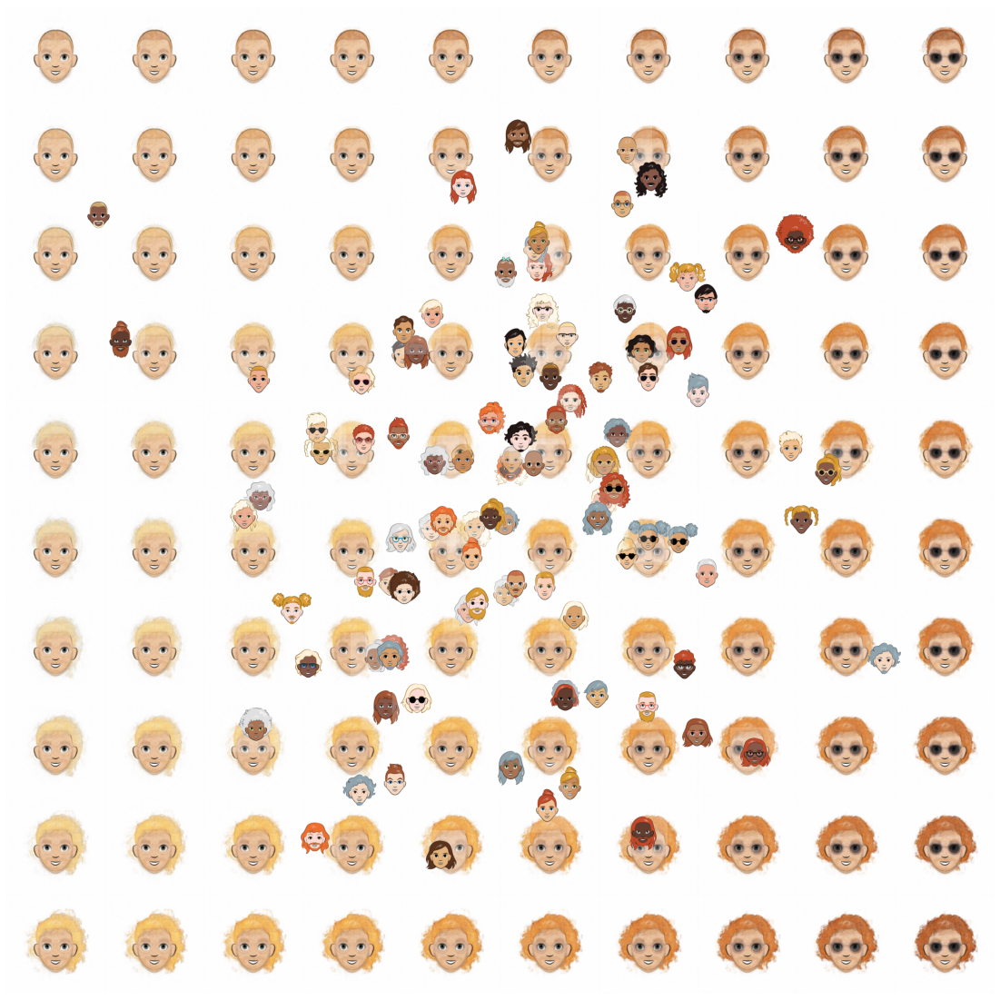

In [ ]:
def insert_img(large_img, img, x, y):
    large_img.paste(img, box=(x, y), mask=img)
    return large_img

def nparray2rgba(im):
    """Convert into PIL image with alpha channel = 0 where background is white"""
    # Create alpha channel
    alpha = np.where(im == [1, 1, 1], 0.2, 1)
    alpha = alpha[:, :, 0]
    # Add the alpha layer into the original image, to have 4 channels
    im_rgba = np.concatenate((im, np.reshape(alpha, (im.shape[0], im.shape[1], 1))), axis=2)
    # convert into RGBA PIL image
    im_pil = Image.fromarray(np.uint8(im_rgba * 255), mode='RGBA')
    resizing_fctr = 2
    # im_pil = im_pil.resize(size=(int(im_pil.size[0]/resizing_fctr),int(im_pil.size[1]/resizing_fctr)))
    im_pil = im_pil.reduce(resizing_fctr)
    return im_pil

n_originals = 100

grid_w_original = Image.fromarray(np.uint8(grid_reconst * 255), mode='RGB')
print(grid_w_original.getbands(), grid_w_original.size)

img_idx = np.random.choice(imgs_to_show.shape[0], size=(n_originals))
for i, im in enumerate(imgs_to_show[img_idx]):
    x = int(embs_pcs[i, 0] * scaling_pc1 + ctr_pc1 )
    y = int(embs_pcs[i, 1] * scaling_pc2 + ctr_pc2)
    print(i, x, y, im.shape)
    dispmod.clear_output(wait=True)
    grid_w_original = insert_img(grid_w_original, nparray2rgba(im), x, y)

_, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,20))
ax.imshow(grid_w_original)
ax.set_axis_off()
print(f"Plotting reconstructed grid and position {n_originals} original images on the grid")
plt.show();

## Play with `.take()`

In [ ]:
for batch in train_ds.take(5):
    _, axs = plt.subplots(nrows=1, ncols=5)
    for i, ax in enumerate(axs):
        ax.imshow(batch[i, :, :, :]/255.)
        ax.set_axis_off()
        
    plt.show()

## Play with `np.meshgrid()` and `np.reshape`

In [ ]:
n = 5
pc1 = np.reshape(np.linspace(start=0, stop=300, num=n), (n, 1))
pc2 = np.reshape(np.linspace(start=0, stop=300, num=n), (n, 1))
print('shapes pc1:  ', pc1.shape, ' - pc2:   ', pc2.shape, '\n')

# np.mesh creates several arrays, with "coordinates of a grid" for each axis. In this cases, x and y values for all the points.
mesh1, mesh2 = np.meshgrid(pc1, pc2)
print('shapes mesh1:', mesh1.shape, ' - mesh2: ', mesh2.shape)
display(mesh1)
display(mesh2)

# to create a series of coordinates we need to flatten the mesh arrays
# display(pc1.shape, pc2.shape, mesh1.shape, mesh2.shape, np.reshape(mesh1, (n*n, 1)).shape, np.reshape(mesh2, (n*n, 1)).shape)
fmesh1 = np.reshape(mesh1, (n*n, -1))
fmesh2 = np.reshape(mesh2, (n*n, -1))
print()
print('shapes fmesh1:', fmesh1.shape, ' - mesh2: ', mesh2.shape)
display(fmesh1[0:3])
display(fmesh2[0:3])

# create 1D array with coordinates
grid_coord = np.concatenate((fmesh1, fmesh2), axis=1)
print()
print('shapes grid_coord:  ', grid_coord.shape)
grid_coord[0:3]

shapes pc1:   (5, 1)  - pc2:    (5, 1) 

shapes mesh1: (5, 5)  - mesh2:  (5, 5)


array([[  0.,  75., 150., 225., 300.],
       [  0.,  75., 150., 225., 300.],
       [  0.,  75., 150., 225., 300.],
       [  0.,  75., 150., 225., 300.],
       [  0.,  75., 150., 225., 300.]])

array([[  0.,   0.,   0.,   0.,   0.],
       [ 75.,  75.,  75.,  75.,  75.],
       [150., 150., 150., 150., 150.],
       [225., 225., 225., 225., 225.],
       [300., 300., 300., 300., 300.]])


shapes fmesh1: (25, 1)  - mesh2:  (5, 5)


array([[  0.],
       [ 75.],
       [150.]])

array([[0.],
       [0.],
       [0.]])


shapes grid_coord:   (25, 2)


array([[  0.,   0.],
       [ 75.,   0.],
       [150.,   0.]])

## Play with masked operations

Documentation [here](https://numpy.org/doc/stable/reference/maskedarray.generic.html)

In [ ]:
x = np.array([1, 2, 3, -1, 5])
mask = np.where(x < 0, 1, 0)
mask

array([0, 0, 0, 1, 0])

In [ ]:
mx = np.ma.masked_array(x, mask=mask)
x.mean(), mx.mean()

(2.0, 2.75)

In [ ]:
display(mx)
mx.data, mx.mask

masked_array(data=[1, 2, 3, --, 5],
             mask=[False, False, False,  True, False],
       fill_value=999999)

(array([ 1,  2,  3, -1,  5]), array([False, False, False,  True, False]))

In [ ]:
mx[0], mx[3]

(1, masked)

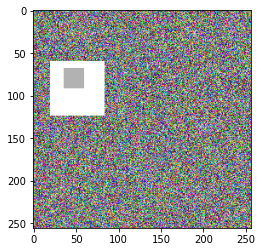

In [ ]:
def insert_img(large_img, img, x, y):
    lh, lw, sh, sw = large_img.shape[0], large_img.shape[1], img.shape[0], img.shape[1]
    assert lw > sw
    assert lh > sh
    assert x <= lh-sw
    assert y <= lw-sh
    # print(f"{y}:{y+sh}, {x}:{x+sw}, :")
    large_img[y:y+sh, x:x+sw, :] = img
    return large_img


# iml = imgs[0].copy()
# ims = imgs[1].copy()[0:75, 100:175, :]

iml = np.random.uniform(size=(256, 256, 3))
ims = np.ones(shape=(64, 64, 3)) * 1.
ims[8:32, 16:40, :] = 0.7

# plt.imshow(iml); plt.show()
# plt.imshow(ims); plt.show()
plt.imshow(insert_img(iml, ims, 20, 60)); plt.show()

In [ ]:
mask = np.where(ims<0.99 , 0, 1 )
print(mask.shape)
mask[:,:,0]

(64, 64, 3)


array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

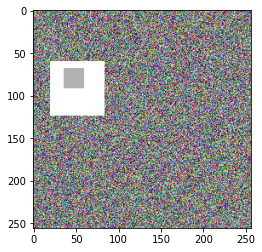

In [ ]:
# Masked operations does not seem to work for assignment !
ims_m = np.ma.array(ims, mask=mask)
plt.imshow(insert_img(iml, ims, 20, 60)); plt.show()